# Project Second Part

In [128]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
import pandas_profiling 
from numpy import argmax
import itertools
%matplotlib inline
sns.set(color_codes=True)

# setting up plot style 
style.use('seaborn-poster')
style.use('fivethirtyeight')

In [129]:
import warnings
warnings.filterwarnings('ignore')

In [130]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

In [131]:
df = pd.read_csv("Basketball.csv")
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33,23,1929,1
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25,25,1929,1
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10,8,1929,1
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6,6,1931to32,1
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8,7,1929,1


In [132]:
df.tail()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
56,Team 57,1,34,38,8,10,20,38,66,-,-,2009-10,20
57,Team 58,1,22,30,7,8,15,37,57,-,-,1956-57,16
58,Team 59,1,19,30,7,5,18,51,85,-,-,1951~52,16
59,Team 60,1,14,30,5,4,21,34,65,-,-,1955-56,15
60,Team 61,1,-,-,-,-,-,-,-,-,-,2017~18,9


In [133]:
df.shape

(61, 13)

In [134]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Team                 61 non-null     object
 1   Tournament           61 non-null     int64 
 2   Score                61 non-null     object
 3   PlayedGames          61 non-null     object
 4   WonGames             61 non-null     object
 5   DrawnGames           61 non-null     object
 6   LostGames            61 non-null     object
 7   BasketScored         61 non-null     object
 8   BasketGiven          61 non-null     object
 9   TournamentChampion   61 non-null     object
 10  Runner-up            61 non-null     object
 11  TeamLaunch           61 non-null     object
 12  HighestPositionHeld  61 non-null     int64 
dtypes: int64(2), object(11)
memory usage: 6.3+ KB


In [135]:
df.isnull().sum()

Team                   0
Tournament             0
Score                  0
PlayedGames            0
WonGames               0
DrawnGames             0
LostGames              0
BasketScored           0
BasketGiven            0
TournamentChampion     0
Runner-up              0
TeamLaunch             0
HighestPositionHeld    0
dtype: int64

In [136]:
#Check if the Score column contains anything other than digits 
# run the "isdigit() check on 'Score' column of the df dataframe. Result will be True or False for every row

temp_Score = pd.DataFrame(df.Score.str.isdigit())

temp_Score[temp_Score['Score'] == False] 

,Score
60,False


In [137]:
temp_PlayedGames = pd.DataFrame(df.PlayedGames.str.isdigit())

temp_PlayedGames[temp_PlayedGames['PlayedGames'] == False] 

,PlayedGames
60,False


In [138]:
def nodigitsscheck(cols):
    for i in cols:
        print(i)
        temp_i = pd.DataFrame(df[i].str.isdigit())
        print(temp_i[temp_i[i] == False])
    

In [139]:
col_list = list(df.columns)
col_list.pop(0)
col_list.pop(0)
col_list.pop(-1)
col_list

['Score',
 'PlayedGames',
 'WonGames',
 'DrawnGames',
 'LostGames',
 'BasketScored',
 'BasketGiven',
 'TournamentChampion',
 'Runner-up',
 'TeamLaunch']

In [140]:
nodigitsscheck(col_list)

Score
    Score
60  False
PlayedGames
    PlayedGames
60        False
WonGames
    WonGames
60     False
DrawnGames
    DrawnGames
60       False
LostGames
    LostGames
60      False
BasketScored
    BasketScored
60         False
BasketGiven
    BasketGiven
60        False
TournamentChampion
    TournamentChampion
6                False
8                False
11               False
12               False
13               False
14               False
15               False
16               False
17               False
18               False
19               False
20               False
21               False
22               False
23               False
24               False
25               False
26               False
27               False
28               False
29               False
30               False
31               False
32               False
33               False
34               False
35               False
36               False
37               False
38              

## Converting all '-' to np.nan

In [141]:
df = df.replace('-', np.nan)
df.tail()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009-10,20
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956-57,16
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951~52,16
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955-56,15
60,Team 61,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017~18,9


In [142]:
df.isnull().sum()

Team                    0
Tournament              0
Score                   1
PlayedGames             1
WonGames                1
DrawnGames              1
LostGames               1
BasketScored            1
BasketGiven             1
TournamentChampion     52
Runner-up              48
TeamLaunch              0
HighestPositionHeld     0
dtype: int64

In [143]:
# Percentage of Null Values for all Columns 
np.round((df.isnull().sum()/df.shape[0])*100,2)

Team                    0.00
Tournament              0.00
Score                   1.64
PlayedGames             1.64
WonGames                1.64
DrawnGames              1.64
LostGames               1.64
BasketScored            1.64
BasketGiven             1.64
TournamentChampion     85.25
Runner-up              78.69
TeamLaunch              0.00
HighestPositionHeld     0.00
dtype: float64

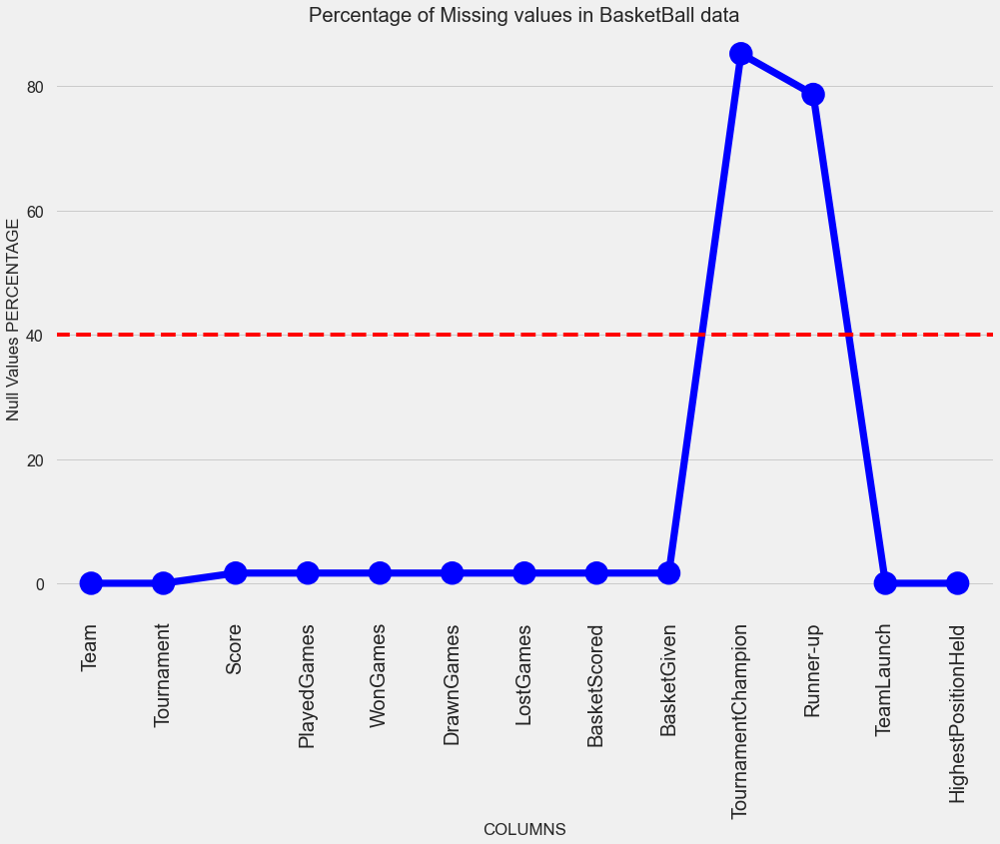

In [144]:
null_df = pd.DataFrame(((df.isnull().sum())/df.shape[0])*100).reset_index()
null_df.columns = ['Column_Name', 'Null_Values_Percentage']
fig = plt.figure(figsize=(15,10))
ax = sns.pointplot(x='Column_Name',y='Null_Values_Percentage',data=null_df,color ='blue')
plt.xticks(rotation =90,fontsize =20)
ax.axhline(40, ls='--',color='red')
plt.title("Percentage of Missing values in BasketBall data")
plt.ylabel("Null Values PERCENTAGE")
plt.xlabel("COLUMNS")
plt.show()

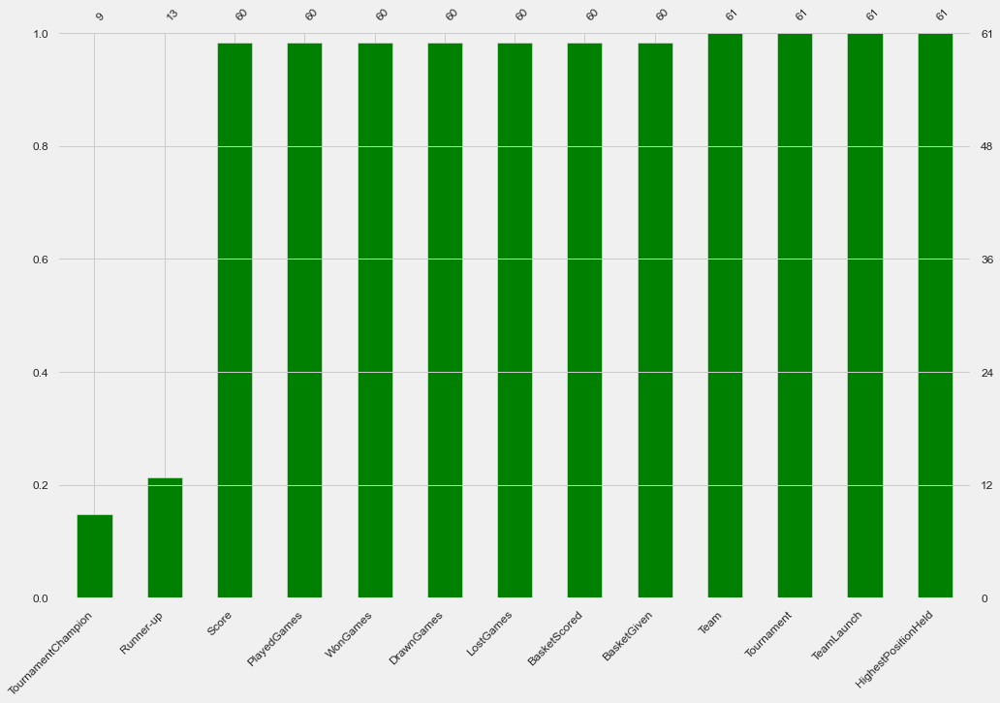

In [145]:
import missingno as mn
mn.bar(df, color="green", sort="ascending", figsize=(15,10), fontsize=12);

## Outlier Check

In [146]:
df.columns

Index(['Team', 'Tournament', 'Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven', 'TournamentChampion', 'Runner-up', 'TeamLaunch', 'HighestPositionHeld'], dtype='object')

In [147]:
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33,23,1929,1
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25,25,1929,1
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10,8,1929,1
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6,6,1931to32,1
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8,7,1929,1


In [148]:
df[['Tournament', 'Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven', 'TournamentChampion', 'Runner-up']] = df[['Tournament', 'Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven', 'TournamentChampion', 'Runner-up']].astype(float)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86.0,4385.0,2762.0,1647.0,552.0,563.0,5947.0,3140.0,33.0,23.0,1929,1
1,Team 2,86.0,4262.0,2762.0,1581.0,573.0,608.0,5900.0,3114.0,25.0,25.0,1929,1
2,Team 3,80.0,3442.0,2614.0,1241.0,598.0,775.0,4534.0,3309.0,10.0,8.0,1929,1
3,Team 4,82.0,3386.0,2664.0,1187.0,616.0,861.0,4398.0,3469.0,6.0,6.0,1931to32,1
4,Team 5,86.0,3368.0,2762.0,1209.0,633.0,920.0,4631.0,3700.0,8.0,7.0,1929,1
5,Team 6,73.0,2819.0,2408.0,990.0,531.0,887.0,3680.0,3373.0,1.0,4.0,1934-35,1
6,Team 7,82.0,2792.0,2626.0,948.0,608.0,1070.0,3609.0,3889.0,NaN,NaN,1929,3
7,Team 8,70.0,2573.0,2302.0,864.0,577.0,861.0,3228.0,3230.0,2.0,3.0,1929,1
8,Team 9,58.0,2109.0,1986.0,698.0,522.0,766.0,2683.0,2847.0,NaN,1.0,1939-40,2
9,Team 10,51.0,1884.0,1728.0,606.0,440.0,682.0,2159.0,2492.0,1.0,NaN,1932-33,1


<AxesSubplot:>

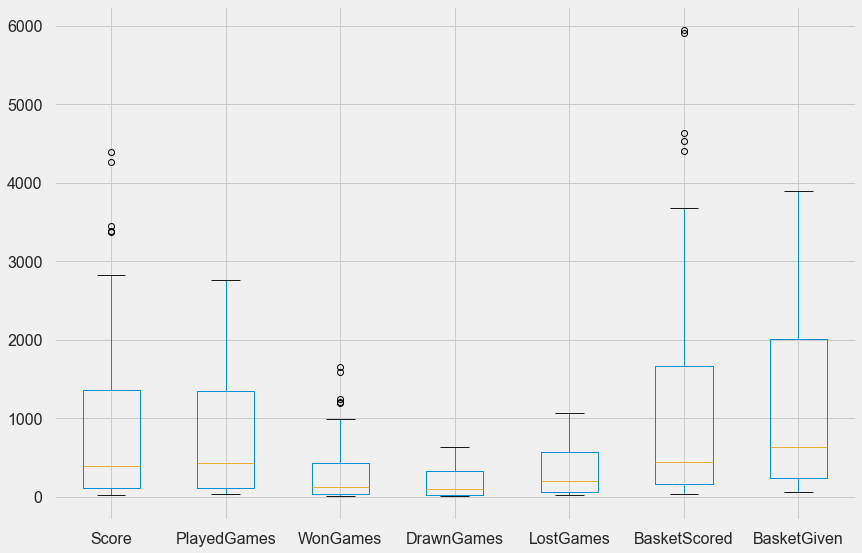

In [149]:
df[['Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven']].boxplot()

## Distribution of the numerical cols

In [150]:
df_num = df[['Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven']]

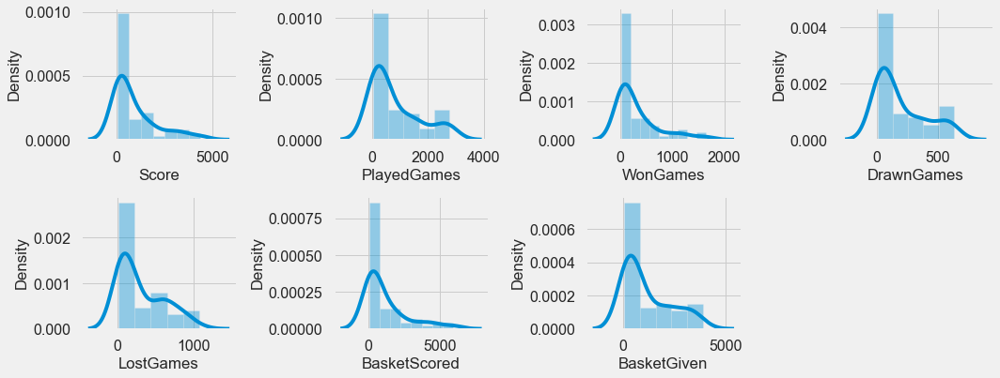

In [151]:

fig = plt.figure(figsize = (15, 8))
for i in range(0, len(df_num.columns)):
    ax = fig.add_subplot(3, 4, i+1)
    sns.distplot(df_num[df_num.columns[i]])
    plt.tight_layout()


## Imputing the missing values in numerical cols

In [152]:
df_num

,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven
0,4385.0,2762.0,1647.0,552.0,563.0,5947.0,3140.0
1,4262.0,2762.0,1581.0,573.0,608.0,5900.0,3114.0
2,3442.0,2614.0,1241.0,598.0,775.0,4534.0,3309.0
3,3386.0,2664.0,1187.0,616.0,861.0,4398.0,3469.0
4,3368.0,2762.0,1209.0,633.0,920.0,4631.0,3700.0
5,2819.0,2408.0,990.0,531.0,887.0,3680.0,3373.0
6,2792.0,2626.0,948.0,608.0,1070.0,3609.0,3889.0
7,2573.0,2302.0,864.0,577.0,861.0,3228.0,3230.0
8,2109.0,1986.0,698.0,522.0,766.0,2683.0,2847.0
9,1884.0,1728.0,606.0,440.0,682.0,2159.0,2492.0


## Imputing the missing data

In [153]:
df['Score'].loc[58:59]

58    19.0
59    14.0
Name: Score, dtype: float64

In [154]:
df['Score'].loc[58:59].mean()

16.5

In [155]:
df['Score'].fillna(df['Score'].loc[58:59].mean(), inplace = True)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86.0,4385.0,2762.0,1647.0,552.0,563.0,5947.0,3140.0,33.0,23.0,1929,1
1,Team 2,86.0,4262.0,2762.0,1581.0,573.0,608.0,5900.0,3114.0,25.0,25.0,1929,1
2,Team 3,80.0,3442.0,2614.0,1241.0,598.0,775.0,4534.0,3309.0,10.0,8.0,1929,1
3,Team 4,82.0,3386.0,2664.0,1187.0,616.0,861.0,4398.0,3469.0,6.0,6.0,1931to32,1
4,Team 5,86.0,3368.0,2762.0,1209.0,633.0,920.0,4631.0,3700.0,8.0,7.0,1929,1
5,Team 6,73.0,2819.0,2408.0,990.0,531.0,887.0,3680.0,3373.0,1.0,4.0,1934-35,1
6,Team 7,82.0,2792.0,2626.0,948.0,608.0,1070.0,3609.0,3889.0,NaN,NaN,1929,3
7,Team 8,70.0,2573.0,2302.0,864.0,577.0,861.0,3228.0,3230.0,2.0,3.0,1929,1
8,Team 9,58.0,2109.0,1986.0,698.0,522.0,766.0,2683.0,2847.0,NaN,1.0,1939-40,2
9,Team 10,51.0,1884.0,1728.0,606.0,440.0,682.0,2159.0,2492.0,1.0,NaN,1932-33,1


In [156]:
df['PlayedGames'].fillna(df['PlayedGames'].loc[58:59].mean(), inplace = True)
df['WonGames'].fillna(df['WonGames'].loc[58:59].mean(), inplace = True)
df['DrawnGames'].fillna(df['DrawnGames'].loc[58:59].mean(), inplace = True)
df['LostGames'].fillna(df['LostGames'].loc[58:59].mean(), inplace = True)
df['BasketScored'].fillna(df['BasketScored'].loc[58:59].mean(), inplace = True)
df['BasketGiven'].fillna(df['BasketGiven'].loc[58:59].mean(), inplace = True)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86.0,4385.0,2762.0,1647.0,552.0,563.0,5947.0,3140.0,33.0,23.0,1929,1
1,Team 2,86.0,4262.0,2762.0,1581.0,573.0,608.0,5900.0,3114.0,25.0,25.0,1929,1
2,Team 3,80.0,3442.0,2614.0,1241.0,598.0,775.0,4534.0,3309.0,10.0,8.0,1929,1
3,Team 4,82.0,3386.0,2664.0,1187.0,616.0,861.0,4398.0,3469.0,6.0,6.0,1931to32,1
4,Team 5,86.0,3368.0,2762.0,1209.0,633.0,920.0,4631.0,3700.0,8.0,7.0,1929,1
5,Team 6,73.0,2819.0,2408.0,990.0,531.0,887.0,3680.0,3373.0,1.0,4.0,1934-35,1
6,Team 7,82.0,2792.0,2626.0,948.0,608.0,1070.0,3609.0,3889.0,NaN,NaN,1929,3
7,Team 8,70.0,2573.0,2302.0,864.0,577.0,861.0,3228.0,3230.0,2.0,3.0,1929,1
8,Team 9,58.0,2109.0,1986.0,698.0,522.0,766.0,2683.0,2847.0,NaN,1.0,1939-40,2
9,Team 10,51.0,1884.0,1728.0,606.0,440.0,682.0,2159.0,2492.0,1.0,NaN,1932-33,1


In [157]:
df[['Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven']] = df[['Score', 'PlayedGames', 'WonGames', 'DrawnGames', 'LostGames', 'BasketScored', 'BasketGiven']].astype(int)
df['Tournament'] = df['Tournament'].astype(int)

In [158]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Team                 61 non-null     object 
 1   Tournament           61 non-null     int32  
 2   Score                61 non-null     int32  
 3   PlayedGames          61 non-null     int32  
 4   WonGames             61 non-null     int32  
 5   DrawnGames           61 non-null     int32  
 6   LostGames            61 non-null     int32  
 7   BasketScored         61 non-null     int32  
 8   BasketGiven          61 non-null     int32  
 9   TournamentChampion   9 non-null      float64
 10  Runner-up            13 non-null     float64
 11  TeamLaunch           61 non-null     object 
 12  HighestPositionHeld  61 non-null     int64  
dtypes: float64(2), int32(8), int64(1), object(2)
memory usage: 4.4+ KB


In [159]:
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931to32,1
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934-35,1
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939-40,2
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932-33,1


## Cleaning the TeamLaunch column

In [160]:
import re
for i in range(df.shape[0]):
    df['TeamLaunch'][i] = re.split('[- ~ to _]',df['TeamLaunch'][i])[0]
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1


In [161]:
df['TeamLaunch'] = df['TeamLaunch'].astype(int)

In [162]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Team                 61 non-null     object 
 1   Tournament           61 non-null     int32  
 2   Score                61 non-null     int32  
 3   PlayedGames          61 non-null     int32  
 4   WonGames             61 non-null     int32  
 5   DrawnGames           61 non-null     int32  
 6   LostGames            61 non-null     int32  
 7   BasketScored         61 non-null     int32  
 8   BasketGiven          61 non-null     int32  
 9   TournamentChampion   9 non-null      float64
 10  Runner-up            13 non-null     float64
 11  TeamLaunch           61 non-null     int32  
 12  HighestPositionHeld  61 non-null     int64  
dtypes: float64(2), int32(9), int64(1), object(1)
memory usage: 4.2+ KB


In [163]:

## Changing the Played Games column for  Team 61

df['PlayedGames'].loc[60] = 29 
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1


## Creating new columns

# Below columns are created.

1. Win_Percentage	
2. Draw_Percentage	
3. Loss_Percentage	
4. Games_per_tournament	
5. Score_to_BasketScored_ratio	
6. Score_to_BasketGiven_ratio
7. Age_of_team
8. Score_per_Tournament


In [164]:
df['Win_Percentage'] = np.round((df['WonGames']/df['PlayedGames'])*100,2)
df['Draw_Percentage'] = np.round((df['DrawnGames']/df['PlayedGames'])*100,2)
df['Loss_Percentage'] = np.round((df['LostGames']/df['PlayedGames'])*100,2)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2,35.15,26.28,38.57
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1,35.07,25.46,39.47


In [165]:
df['Games_per_tournament'] = np.round((df['PlayedGames']/df['Tournament']),2)
df['Score_to_BasketScored_ratio'] = np.round((df['Score']/df['BasketScored']),2)
df['Score_to_BasketGiven_ratio'] = np.round((df['Score']/df['BasketGiven']),2)
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91


In [166]:
df.tail()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.0,0.89,0.52
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956,16,23.33,26.67,50.00,30.0,0.59,0.39
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951,16,23.33,16.67,60.00,30.0,0.37,0.22
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955,15,16.67,13.33,70.00,30.0,0.41,0.22
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.0,0.38,0.21


In [167]:
import datetime
df['Current Year'] = datetime.datetime.now().year
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Current Year
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,2021
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,2021
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,2021
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,2021
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,2021


In [168]:
df['Age_of_team'] = df['Current Year'] - df['TeamLaunch']
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Current Year,Age_of_team
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,2021,92
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,2021,92
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,2021,92
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,2021,90
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,2021,92


In [169]:
df.tail()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Current Year,Age_of_team
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.0,0.89,0.52,2021,12
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956,16,23.33,26.67,50.00,30.0,0.59,0.39,2021,65
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951,16,23.33,16.67,60.00,30.0,0.37,0.22,2021,70
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955,15,16.67,13.33,70.00,30.0,0.41,0.22,2021,66
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.0,0.38,0.21,2021,4


In [170]:
df.drop('Current Year',inplace=True, axis=1)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84,32.99,0.77,0.84,87
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2,35.15,26.28,38.57,34.24,0.79,0.74,82
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1,35.07,25.46,39.47,33.88,0.87,0.76,89


In [171]:
df['Score_per_Tournament'] = np.round(df['Score']/df['Tournament'],2)
df

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84,32.99,0.77,0.84,87,38.62
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92,34.05
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92,36.76
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2,35.15,26.28,38.57,34.24,0.79,0.74,82,36.36
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1,35.07,25.46,39.47,33.88,0.87,0.76,89,36.94


In [172]:
df.to_csv('BasketBall_Cleaned.csv')

In [173]:
df= pd.read_csv('BasketBall_Cleaned.csv')

In [174]:
df.head()

,Unnamed: 0,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
2,2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
3,3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
4,4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16


In [175]:
df.isnull().sum()

Unnamed: 0                      0
Team                            0
Tournament                      0
Score                           0
PlayedGames                     0
WonGames                        0
DrawnGames                      0
LostGames                       0
BasketScored                    0
BasketGiven                     0
TournamentChampion             52
Runner-up                      48
TeamLaunch                      0
HighestPositionHeld             0
Win_Percentage                  0
Draw_Percentage                 0
Loss_Percentage                 0
Games_per_tournament            0
Score_to_BasketScored_ratio     0
Score_to_BasketGiven_ratio      0
Age_of_team                     0
Score_per_Tournament            0
dtype: int64

In [176]:
df.drop(['Unnamed: 0'], axis = 1, inplace=True)

In [177]:
df.head()

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16


In [178]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [179]:
pandas_profiling.ProfileReport(df).to_file(output_file='Basketball_Report.html')

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [180]:
df.describe()

,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
count,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,9.000000,13.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000
mean,24.000000,901.688525,797.295082,304.065574,189.000000,304.065574,1141.032787,1141.459016,9.666667,6.615385,1958.918033,7.081967,31.189672,23.456066,45.328689,33.365574,0.793770,0.638361,62.081967,32.777705
std,26.827225,1134.689143,875.851021,406.917062,201.737701,294.392078,1506.219937,1162.525004,11.618950,8.109033,27.484114,5.276663,7.885237,4.597611,8.735583,4.727613,0.193917,0.248128,27.484114,9.608836
min,1.000000,14.000000,29.000000,5.000000,4.000000,15.000000,34.000000,55.000000,1.000000,1.000000,1929.000000,1.000000,16.670000,11.110000,20.380000,18.000000,0.370000,0.210000,4.000000,14.000000
25%,4.000000,96.000000,114.000000,34.000000,24.000000,62.000000,153.000000,221.000000,1.000000,1.000000,1935.000000,3.000000,27.190000,22.300000,41.280000,31.400000,0.730000,0.510000,43.000000,25.910000
50%,12.000000,375.000000,423.000000,123.000000,95.000000,197.000000,430.000000,632.000000,6.000000,4.000000,1951.000000,6.000000,30.280000,24.340000,45.790000,33.290000,0.800000,0.650000,70.000000,34.050000
75%,38.000000,1351.000000,1318.000000,426.000000,330.000000,563.000000,1642.000000,1951.000000,10.000000,7.000000,1978.000000,10.000000,33.490000,26.190000,48.580000,37.330000,0.920000,0.740000,86.000000,39.160000
max,86.000000,4385.000000,2762.000000,1647.000000,633.000000,1070.000000,5947.000000,3889.000000,33.000000,25.000000,2017.000000,20.000000,59.630000,38.600000,70.000000,40.000000,1.340000,1.400000,92.000000,57.060000


## Best Performing Team

Best Peforming Team is "Team 1" and the below list has the top 10 best performing teams displayed.

In [181]:
df.sort_values(by='Win_Percentage', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.00,1.09,1.23,23,57.06
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84,32.99,0.77,0.84,87,38.62
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92,36.76
10,Team 11,45,1814,1530,563,392,575,2052,2188,1.0,5.0,1941,1,36.80,25.62,37.58,34.00,0.88,0.83,80,40.31
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92,34.05


<AxesSubplot:xlabel='Team', ylabel='Win_Percentage'>

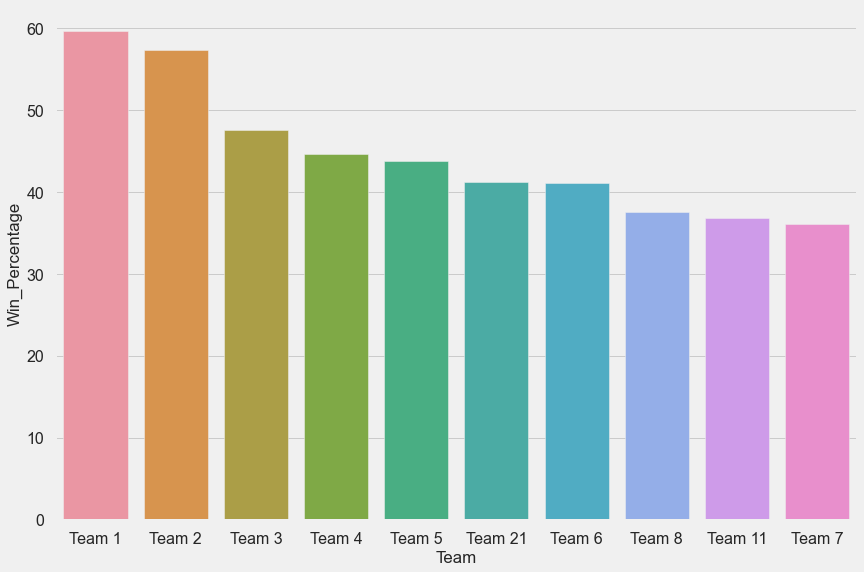

In [182]:
sns.barplot(y='Win_Percentage', x='Team', data=df.sort_values(by='Win_Percentage', ascending=False).head(10))

## Oldest Team

Oldest Team is "Team 1" with Age='92' and the below list has the oldest teams displayed.



In [183]:
df['Age_of_team'].max()

92

In [184]:
df[df['Age_of_team']==92]

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92,34.05
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92,36.76
13,Team 14,44,1416,1428,453,336,639,1843,2368,NaN,1.0,1929,2,31.72,23.53,44.75,32.45,0.77,0.60,92,32.18
44,Team 45,7,107,130,43,21,66,227,308,NaN,NaN,1929,3,33.08,16.15,50.77,18.57,0.47,0.35,92,15.29
51,Team 52,4,56,72,21,14,37,153,184,NaN,NaN,1929,6,29.17,19.44,51.39,18.00,0.37,0.30,92,14.00
53,Team 54,3,42,54,18,6,30,97,131,NaN,NaN,1929,8,33.33,11.11,55.56,18.00,0.43,0.32,92,14.00


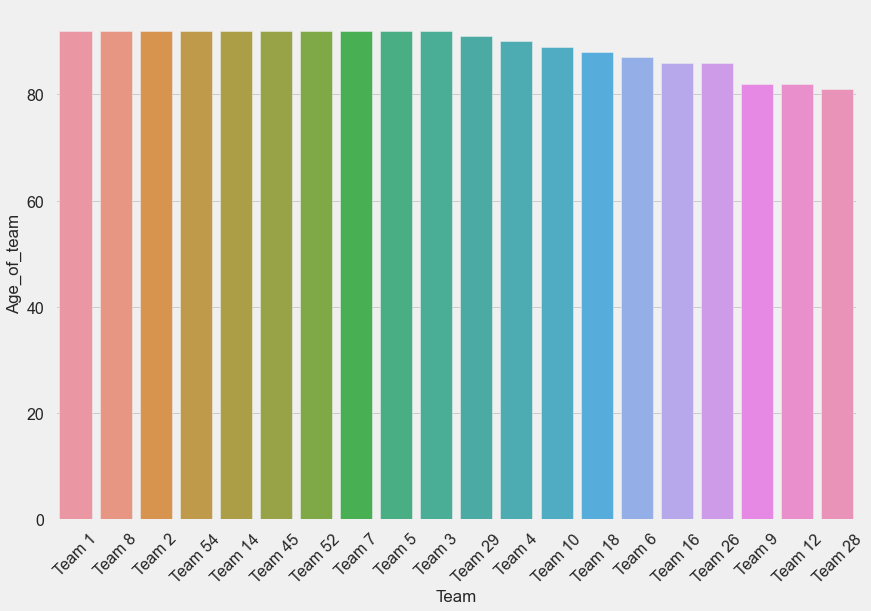

In [185]:
sns.barplot(y='Age_of_team', x='Team', data=df[df['Age_of_team']<=92].sort_values(by='Age_of_team', ascending=False).head(20))
plt.xticks(rotation = 45)
plt.show()

## Newest Team

Newest Team is "Team 61" with Age='4' and the below list has the top 10 newest teams displayed.

In [186]:
df['Age_of_team'].min()

4

In [187]:
df[df['Age_of_team']>=4].sort_values(by='Age_of_team', ascending=True).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.0,0.38,0.21,4,16.00
55,Team 56,1,35,38,8,11,19,36,55,NaN,NaN,2016,17,21.05,28.95,50.00,38.0,0.97,0.64,5,35.00
43,Team 44,3,132,114,35,27,52,139,167,NaN,NaN,2014,10,30.70,23.68,45.61,38.0,0.95,0.79,7,44.00
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.0,0.89,0.52,12,34.00
36,Team 37,6,242,228,62,56,110,244,366,NaN,NaN,2007,8,27.19,24.56,48.25,38.0,0.99,0.66,14,40.33
24,Team 25,12,553,456,147,112,197,520,633,NaN,NaN,2004,6,32.24,24.56,43.20,38.0,1.06,0.87,17,46.08
42,Team 43,4,148,152,37,37,78,155,253,NaN,NaN,1999,17,24.34,24.34,51.32,38.0,0.95,0.58,22,37.00
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.0,1.09,1.23,23,57.06
47,Team 48,2,83,80,20,23,37,62,117,NaN,NaN,1996,17,25.00,28.75,46.25,40.0,1.34,0.71,25,41.50
48,Team 49,2,81,80,19,24,37,70,115,NaN,NaN,1995,19,23.75,30.00,46.25,40.0,1.16,0.70,26,40.50


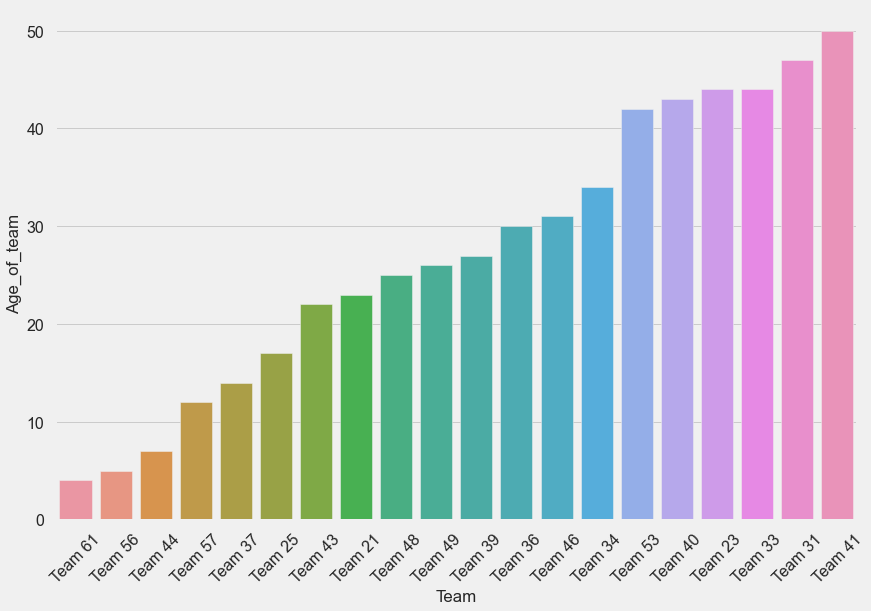

In [188]:
sns.barplot(y='Age_of_team', x='Team', data=df[df['Age_of_team']>=4].sort_values(by='Age_of_team', ascending=True).head(20))
plt.xticks(rotation = 45)
plt.show()

## Highest Baskets Team

The team with highest number of baskets is "Team 1" and the below list has the top 10 teams with highest number of baskets displayed.

In [189]:
df.sort_values(by='BasketScored', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84,32.99,0.77,0.84,87,38.62
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92,34.05
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92,36.76
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2,35.15,26.28,38.57,34.24,0.79,0.74,82,36.36
11,Team 12,51,1789,1698,586,389,723,2278,2624,NaN,NaN,1939,4,34.51,22.91,42.58,33.29,0.79,0.68,82,35.08


<AxesSubplot:xlabel='Team', ylabel='BasketScored'>

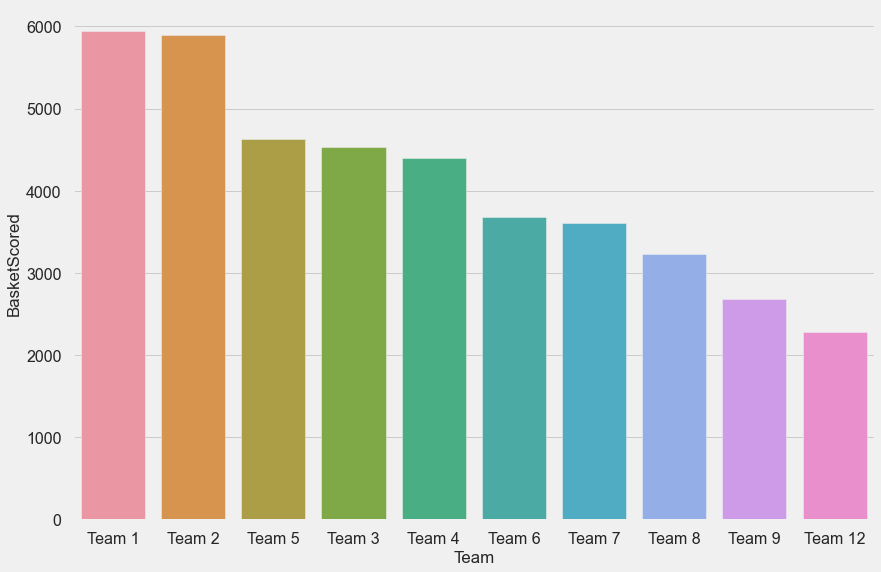

In [190]:
sns.barplot(y='BasketScored', x='Team', data=df.sort_values(by='BasketScored', ascending=False).head(10))

## Lowest Performance Team

The Lowest performing team is "Team 60" and the below list has the top 10 teams with lowest performance.

In [191]:
df.sort_values(by='Loss_Percentage', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955,15,16.67,13.33,70.00,30.0,0.41,0.22,66,14.00
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.0,0.38,0.21,4,16.00
54,Team 55,2,40,68,13,14,41,70,182,NaN,NaN,1950,16,19.12,20.59,60.29,34.0,0.57,0.22,71,20.00
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951,16,23.33,16.67,60.00,30.0,0.37,0.22,70,19.00
49,Team 50,4,76,108,30,16,62,145,252,NaN,NaN,1945,10,27.78,14.81,57.41,27.0,0.52,0.30,76,19.00
46,Team 47,4,91,116,34,16,66,181,295,NaN,NaN,1947,7,29.31,13.79,56.90,29.0,0.50,0.31,74,22.75
53,Team 54,3,42,54,18,6,30,97,131,NaN,NaN,1929,8,33.33,11.11,55.56,18.0,0.43,0.32,92,14.00
50,Team 51,3,71,90,29,13,48,121,183,NaN,NaN,1953,14,32.22,14.44,53.33,30.0,0.59,0.39,68,23.67
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.0,0.89,0.52,12,34.00
51,Team 52,4,56,72,21,14,37,153,184,NaN,NaN,1929,6,29.17,19.44,51.39,18.0,0.37,0.30,92,14.00


<AxesSubplot:xlabel='Team', ylabel='Loss_Percentage'>

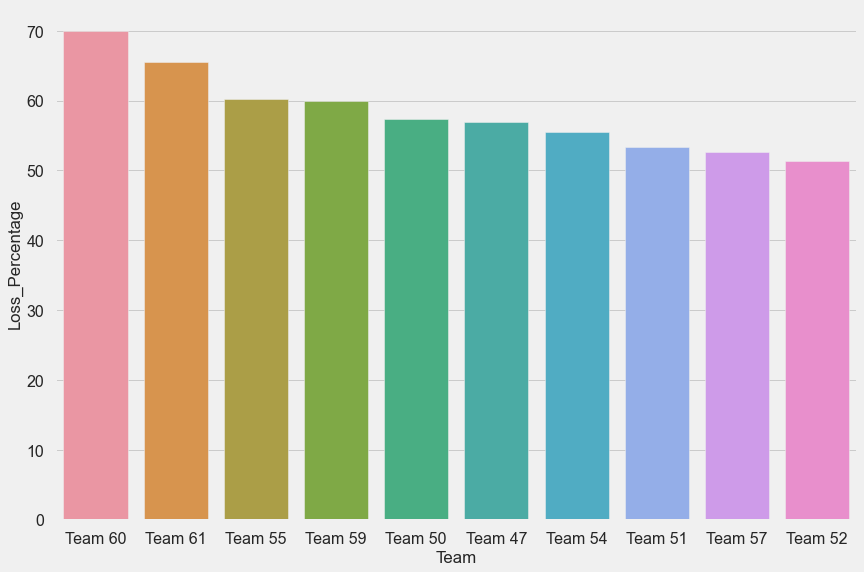

In [192]:
sns.barplot(y='Loss_Percentage', x='Team', data=df.sort_values(by='Loss_Percentage', ascending=False).head(10))

## Most Played Games

The Team with most played games is "Team 1" and the below list has the top 10 and bottom 10 teams with the most played games.

In [193]:
df.sort_values(by='PlayedGames', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
4,Team 5,86,3368,2762,1209,633,920,4631,3700,8.0,7.0,1929,1,43.77,22.92,33.31,32.12,0.73,0.91,92,39.16
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29
6,Team 7,82,2792,2626,948,608,1070,3609,3889,NaN,NaN,1929,3,36.10,23.15,40.75,32.02,0.77,0.72,92,34.05
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
5,Team 6,73,2819,2408,990,531,887,3680,3373,1.0,4.0,1934,1,41.11,22.05,36.84,32.99,0.77,0.84,87,38.62
7,Team 8,70,2573,2302,864,577,861,3228,3230,2.0,3.0,1929,1,37.53,25.07,37.40,32.89,0.80,0.80,92,36.76
8,Team 9,58,2109,1986,698,522,766,2683,2847,NaN,1.0,1939,2,35.15,26.28,38.57,34.24,0.79,0.74,82,36.36
9,Team 10,51,1884,1728,606,440,682,2159,2492,1.0,NaN,1932,1,35.07,25.46,39.47,33.88,0.87,0.76,89,36.94


In [194]:
df.sort_values(by='PlayedGames', ascending=False).tail(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
51,Team 52,4,56,72,21,14,37,153,184,NaN,NaN,1929,6,29.17,19.44,51.39,18.0,0.37,0.30,92,14.0
52,Team 53,2,52,68,17,18,33,71,116,NaN,NaN,1979,10,25.00,26.47,48.53,34.0,0.73,0.45,42,26.0
54,Team 55,2,40,68,13,14,41,70,182,NaN,NaN,1950,16,19.12,20.59,60.29,34.0,0.57,0.22,71,20.0
53,Team 54,3,42,54,18,6,30,97,131,NaN,NaN,1929,8,33.33,11.11,55.56,18.0,0.43,0.32,92,14.0
55,Team 56,1,35,38,8,11,19,36,55,NaN,NaN,2016,17,21.05,28.95,50.00,38.0,0.97,0.64,5,35.0
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.0,0.89,0.52,12,34.0
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956,16,23.33,26.67,50.00,30.0,0.59,0.39,65,22.0
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951,16,23.33,16.67,60.00,30.0,0.37,0.22,70,19.0
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955,15,16.67,13.33,70.00,30.0,0.41,0.22,66,14.0
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.0,0.38,0.21,4,16.0


<AxesSubplot:xlabel='Team', ylabel='PlayedGames'>

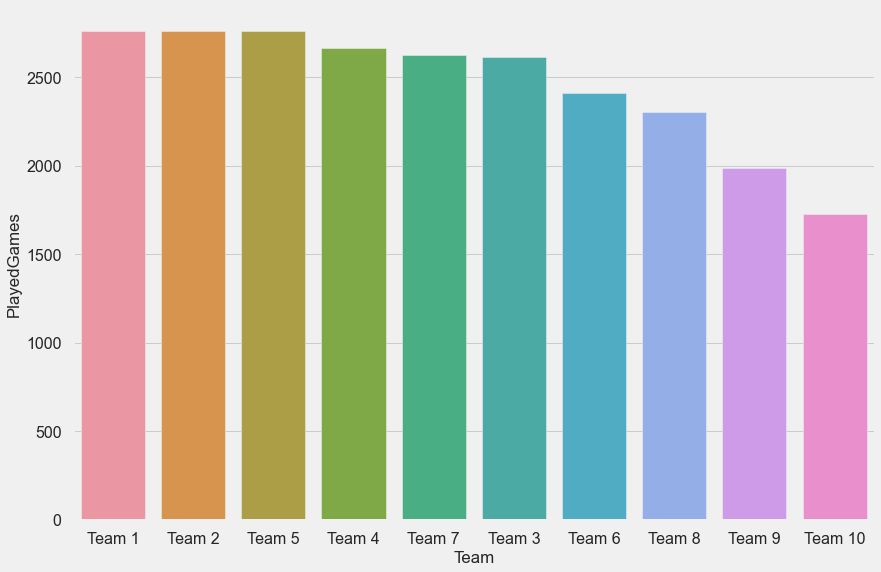

In [195]:
sns.barplot(y='PlayedGames', x='Team', data=df.sort_values(by='PlayedGames', ascending=False).head(10))

<AxesSubplot:xlabel='Team', ylabel='PlayedGames'>

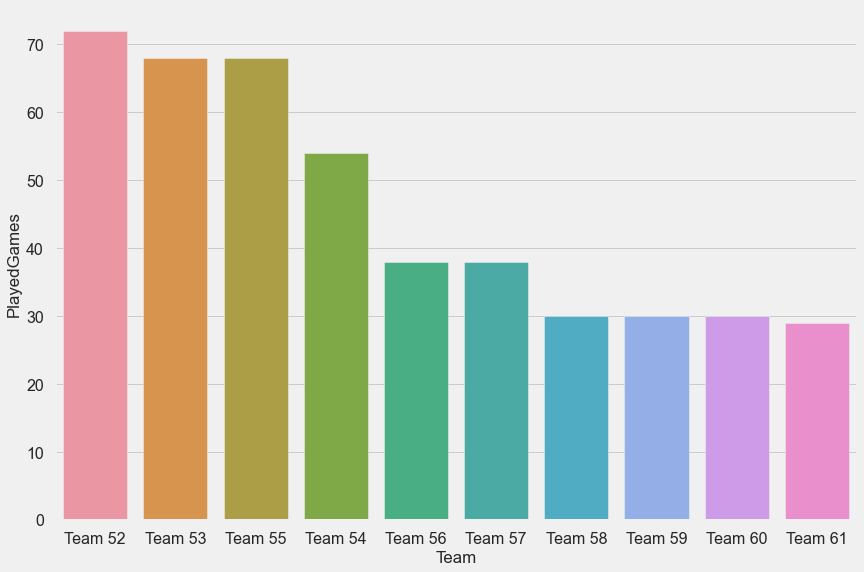

In [196]:
sns.barplot(y='PlayedGames', x='Team', data=df.sort_values(by='PlayedGames', ascending=False).tail(10))

## Most Drawn Games

The Team with most drawn games is "Team 46" and the below list has the top 10 teams with the most drawn games.

In [197]:
df.sort_values(by='Draw_Percentage', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
45,Team 46,3,96,114,26,44,44,101,139,NaN,NaN,1990,9,22.81,38.60,38.60,38.00,0.95,0.69,31,32.00
48,Team 49,2,81,80,19,24,37,70,115,NaN,NaN,1995,19,23.75,30.00,46.25,40.00,1.16,0.70,26,40.50
55,Team 56,1,35,38,8,11,19,36,55,NaN,NaN,2016,17,21.05,28.95,50.00,38.00,0.97,0.64,5,35.00
47,Team 48,2,83,80,20,23,37,62,117,NaN,NaN,1996,17,25.00,28.75,46.25,40.00,1.34,0.71,25,41.50
32,Team 33,12,343,448,104,127,217,393,662,NaN,NaN,1977,12,23.21,28.35,48.44,37.33,0.87,0.52,44,28.58
35,Team 36,7,277,270,76,76,118,320,410,NaN,NaN,1991,7,28.15,28.15,43.70,38.57,0.87,0.68,30,39.57
38,Team 39,4,190,160,52,45,63,199,241,NaN,NaN,1994,10,32.50,28.12,39.38,40.00,0.95,0.79,27,47.50
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956,16,23.33,26.67,50.00,30.00,0.59,0.39,65,22.00
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.00,1.09,1.23,23,57.06
33,Team 34,9,293,346,96,92,158,291,489,NaN,NaN,1987,7,27.75,26.59,45.66,38.44,1.01,0.60,34,32.56


<AxesSubplot:xlabel='Team', ylabel='Draw_Percentage'>

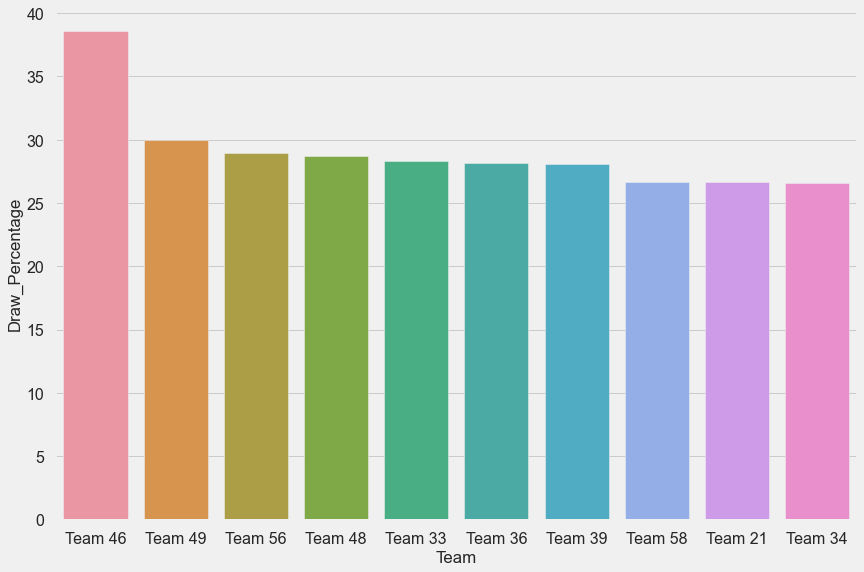

In [198]:
sns.barplot(y='Draw_Percentage', x='Team', data=df.sort_values(by='Draw_Percentage', ascending=False).head(10))

## Most Score Per Tournament

The Team with most score per tournament is "Team 21" and the below list has the top 10 teams and bottom 10 with the most score per tournament.

In [199]:
df.sort_values(by='Score_per_Tournament', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.00,1.09,1.23,23,57.06
0,Team 1,86,4385,2762,1647,552,563,5947,3140,33.0,23.0,1929,1,59.63,19.99,20.38,32.12,0.74,1.40,92,50.99
1,Team 2,86,4262,2762,1581,573,608,5900,3114,25.0,25.0,1929,1,57.24,20.75,22.01,32.12,0.72,1.37,92,49.56
38,Team 39,4,190,160,52,45,63,199,241,NaN,NaN,1994,10,32.50,28.12,39.38,40.00,0.95,0.79,27,47.50
24,Team 25,12,553,456,147,112,197,520,633,NaN,NaN,2004,6,32.24,24.56,43.20,38.00,1.06,0.87,17,46.08
43,Team 44,3,132,114,35,27,52,139,167,NaN,NaN,2014,10,30.70,23.68,45.61,38.00,0.95,0.79,7,44.00
2,Team 3,80,3442,2614,1241,598,775,4534,3309,10.0,8.0,1929,1,47.48,22.88,29.65,32.67,0.76,1.04,92,43.02
18,Team 19,27,1148,988,333,256,399,1182,1371,NaN,NaN,1960,3,33.70,25.91,40.38,36.59,0.97,0.84,61,42.52
47,Team 48,2,83,80,20,23,37,62,117,NaN,NaN,1996,17,25.00,28.75,46.25,40.00,1.34,0.71,25,41.50
3,Team 4,82,3386,2664,1187,616,861,4398,3469,6.0,6.0,1931,1,44.56,23.12,32.32,32.49,0.77,0.98,90,41.29


In [200]:
df.sort_values(by='Score_per_Tournament', ascending=False).tail(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
46,Team 47,4,91,116,34,16,66,181,295,NaN,NaN,1947,7,29.31,13.79,56.90,29.00,0.50,0.31,74,22.75
57,Team 58,1,22,30,7,8,15,37,57,NaN,NaN,1956,16,23.33,26.67,50.00,30.00,0.59,0.39,65,22.00
54,Team 55,2,40,68,13,14,41,70,182,NaN,NaN,1950,16,19.12,20.59,60.29,34.00,0.57,0.22,71,20.00
58,Team 59,1,19,30,7,5,18,51,85,NaN,NaN,1951,16,23.33,16.67,60.00,30.00,0.37,0.22,70,19.00
49,Team 50,4,76,108,30,16,62,145,252,NaN,NaN,1945,10,27.78,14.81,57.41,27.00,0.52,0.30,76,19.00
60,Team 61,1,16,29,6,4,19,42,75,NaN,NaN,2017,9,20.69,13.79,65.52,29.00,0.38,0.21,4,16.00
44,Team 45,7,107,130,43,21,66,227,308,NaN,NaN,1929,3,33.08,16.15,50.77,18.57,0.47,0.35,92,15.29
53,Team 54,3,42,54,18,6,30,97,131,NaN,NaN,1929,8,33.33,11.11,55.56,18.00,0.43,0.32,92,14.00
51,Team 52,4,56,72,21,14,37,153,184,NaN,NaN,1929,6,29.17,19.44,51.39,18.00,0.37,0.30,92,14.00
59,Team 60,1,14,30,5,4,21,34,65,NaN,NaN,1955,15,16.67,13.33,70.00,30.00,0.41,0.22,66,14.00


<AxesSubplot:xlabel='Team', ylabel='Score_per_Tournament'>

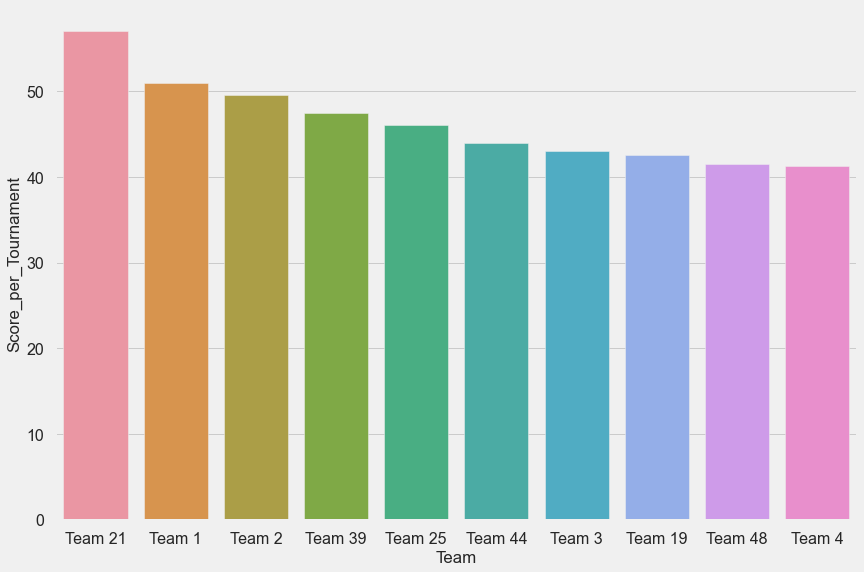

In [201]:
sns.barplot(y='Score_per_Tournament', x='Team', data=df.sort_values(by='Score_per_Tournament', ascending=False).head(10))

<AxesSubplot:xlabel='Team', ylabel='Score_per_Tournament'>

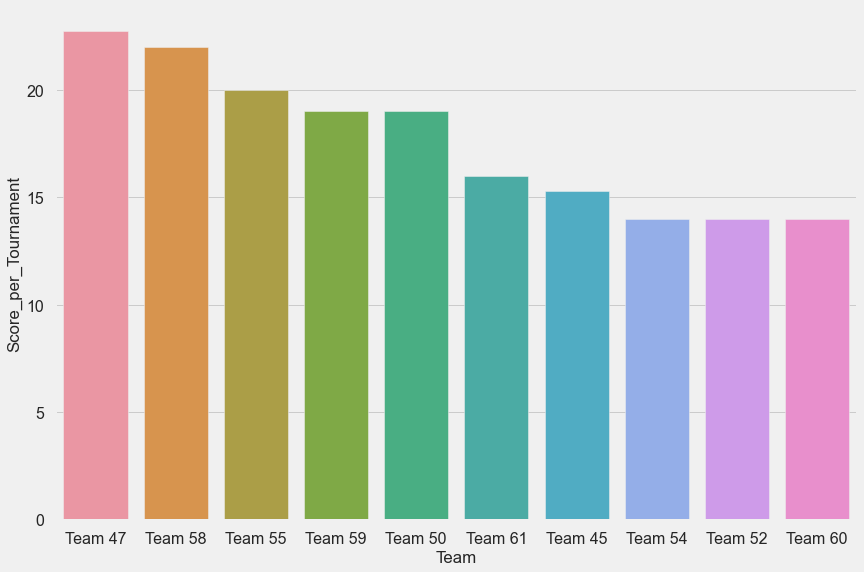

In [202]:
sns.barplot(y='Score_per_Tournament', x='Team', data=df.sort_values(by='Score_per_Tournament', ascending=False).tail(10))

## Most Games Per Tournament

The Team with most games per tournament is "Team 39" and the below list has the top 10 teams with the most games per tournament.

In [203]:
df.sort_values(by='Games_per_tournament', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
38,Team 39,4,190,160,52,45,63,199,241,NaN,NaN,1994,10,32.50,28.12,39.38,40.00,0.95,0.79,27,47.50
47,Team 48,2,83,80,20,23,37,62,117,NaN,NaN,1996,17,25.00,28.75,46.25,40.00,1.34,0.71,25,41.50
48,Team 49,2,81,80,19,24,37,70,115,NaN,NaN,1995,19,23.75,30.00,46.25,40.00,1.16,0.70,26,40.50
35,Team 36,7,277,270,76,76,118,320,410,NaN,NaN,1991,7,28.15,28.15,43.70,38.57,0.87,0.68,30,39.57
33,Team 34,9,293,346,96,92,158,291,489,NaN,NaN,1987,7,27.75,26.59,45.66,38.44,1.01,0.60,34,32.56
22,Team 23,17,662,652,189,148,305,760,1088,NaN,NaN,1977,8,28.99,22.70,46.78,38.35,0.87,0.61,44,38.94
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.00,1.09,1.23,23,57.06
42,Team 43,4,148,152,37,37,78,155,253,NaN,NaN,1999,17,24.34,24.34,51.32,38.00,0.95,0.58,22,37.00
56,Team 57,1,34,38,8,10,20,38,66,NaN,NaN,2009,20,21.05,26.32,52.63,38.00,0.89,0.52,12,34.00
36,Team 37,6,242,228,62,56,110,244,366,NaN,NaN,2007,8,27.19,24.56,48.25,38.00,0.99,0.66,14,40.33


<AxesSubplot:xlabel='Team', ylabel='Games_per_tournament'>

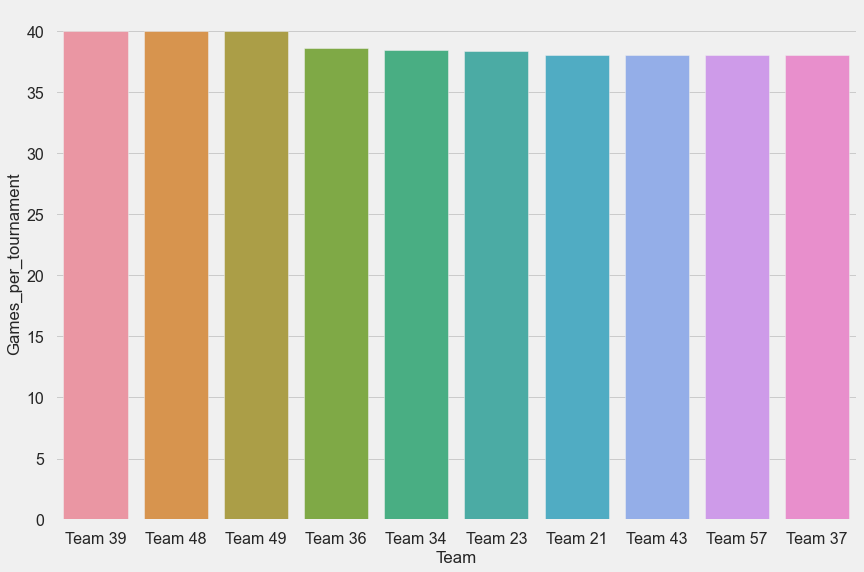

In [204]:
sns.barplot(y='Games_per_tournament', x='Team', data=df.sort_values(by='Games_per_tournament', ascending=False).head(10))

## Most Scored To Basket Scored Ratio

The Team with most games per tournament is "Team 48" and the below list has the top 10 teams with the most games per tournament.

In [205]:
df.sort_values(by='Score_to_BasketScored_ratio', ascending=False).head(10)

,Team,Tournament,Score,PlayedGames,WonGames,DrawnGames,LostGames,BasketScored,BasketGiven,TournamentChampion,Runner-up,TeamLaunch,HighestPositionHeld,Win_Percentage,Draw_Percentage,Loss_Percentage,Games_per_tournament,Score_to_BasketScored_ratio,Score_to_BasketGiven_ratio,Age_of_team,Score_per_Tournament
47,Team 48,2,83,80,20,23,37,62,117,NaN,NaN,1996,17,25.00,28.75,46.25,40.00,1.34,0.71,25,41.50
48,Team 49,2,81,80,19,24,37,70,115,NaN,NaN,1995,19,23.75,30.00,46.25,40.00,1.16,0.70,26,40.50
20,Team 21,17,970,646,266,172,208,892,789,NaN,1.0,1998,2,41.18,26.63,32.20,38.00,1.09,1.23,23,57.06
24,Team 25,12,553,456,147,112,197,520,633,NaN,NaN,2004,6,32.24,24.56,43.20,38.00,1.06,0.87,17,46.08
33,Team 34,9,293,346,96,92,158,291,489,NaN,NaN,1987,7,27.75,26.59,45.66,38.44,1.01,0.60,34,32.56
36,Team 37,6,242,228,62,56,110,244,366,NaN,NaN,2007,8,27.19,24.56,48.25,38.00,0.99,0.66,14,40.33
29,Team 30,11,416,402,113,95,194,430,632,NaN,NaN,1963,6,28.11,23.63,48.26,36.55,0.97,0.66,58,37.82
18,Team 19,27,1148,988,333,256,399,1182,1371,NaN,NaN,1960,3,33.70,25.91,40.38,36.59,0.97,0.84,61,42.52
55,Team 56,1,35,38,8,11,19,36,55,NaN,NaN,2016,17,21.05,28.95,50.00,38.00,0.97,0.64,5,35.00
45,Team 46,3,96,114,26,44,44,101,139,NaN,NaN,1990,9,22.81,38.60,38.60,38.00,0.95,0.69,31,32.00


<AxesSubplot:xlabel='Team', ylabel='Score_to_BasketScored_ratio'>

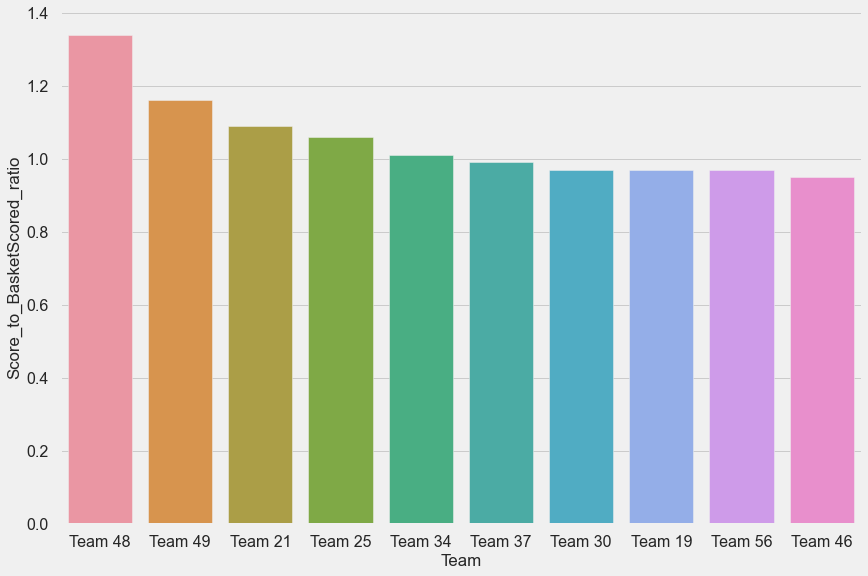

In [206]:
sns.barplot(y='Score_to_BasketScored_ratio', x='Team', data=df.sort_values(by='Score_to_BasketScored_ratio', ascending=False).head(10))

## Highest Position Held By A Team

The Highest position held by a team is "Team 1"

In [207]:
df3 = pd.crosstab(df['Team'],df['HighestPositionHeld'])
df3

HighestPositionHeld,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,17,19,20
Team,,,,,,,,,,,,,,,,,,
Team 1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 11,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 12,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 13,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 14,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 15,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 16,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Team 17,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Recommendations / Improvements


### Quality

Out of the teams based on performance we have Team 1 which is the most recommended seeing the statistics above.

Out of the teams based on performance we have Team 60 which is the least recommended and should be part of improvement seeing the statistics above.


### Quantity

Out of the teams which have the highest number of baskets we have Team 1 which is the most recommended seeing the statistics above.

Out of the teams which have the played the most number of games we have Team 1 which is the most recommended seeing the statistics above.

Out of the teams which have the played the most number of games we have Team 61 which is the least recommended and should be part of improvement seeing the statistics above. Along with 61, Team 58, 59 and 60 should also be part of improvement.


### Variety 

Out of the teams which are old we have Team 1 which is most recommended seeing the statistics above.

Out of the teams which are new we have Team 61 which is most recommended seeing the statistics above.


### Velocity

Out of the teams which have the most score per tournament we have Team 21 which is most recommended seeing the statistics above.

Out of the teams which have the most score per tournament we have Team 60 which is least recommended and should be part of improvement seeing the statistics above. Along with 60, Team 52 and 54 should also be part of improvement.

Out of the teams which have played the most games per tournament we have Team 39 which is most recommended seeing the statistics above.


### Veracity

Out of the teams which have the most scored to basket ratio we have Team 48 which is most recommended seeing the statistics above.

Out of the teams which have the held the highest position we have Team 1 which is most recommended seeing the statistics above.


=========================================================================================================================================================================================================

# Project First Part

In [208]:
import scipy.stats as stats # Many functions for probability distributions in python are in scipy.stats

## 1. Question: Please refer the table below to answer below questions:

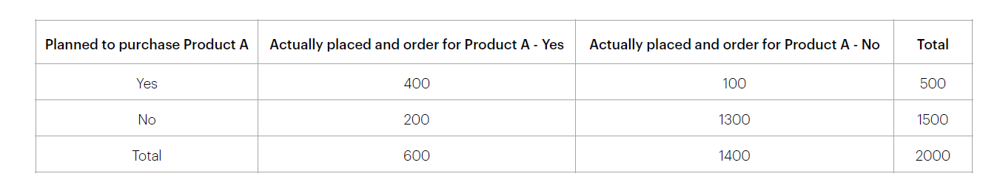

1. Refer to the above table and find the joint probability of the people who planned to purchase and actually
placed an order.

2. Refer to the above table and find the joint probability of the people who planned to purchase and actually
placed an order, given that people planned to purchase.

In [209]:
1. # P(Plan to Purchase (Intersection) Actually Purchased) = P(Plan to Purchase / Actually Purchased) * P(Actually Purchased)
# Plan to Purchase = A, Actually Purchased = B
# P(A Intersection B) = P(A / B) * P(B)

C = 400/600 * 600/2000
C

0.2

In [210]:
2. # Plan to Purchase = A, Actually Purchased = B
# Plan to Purchase Intersection Actually Purchased - (A Intersection B) = C = 400
# P((A Intersection B)/A)

C = 400/500
C

0.8

## 2. Question: An electrical manufacturing company conducts quality checks at specified periods on the products it manufactures. 
## Historically, the failure rate for the manufactured item is 5%. Suppose a random sample of 10 manufactured items is selected. Answer the following questions.


A. Probability that none of the items are defective?

B. Probability that exactly one of the items is defective?

C. Probability that two or fewer of the items are defective?

D. Probability that three or more of the items are defective ?



In [211]:
n,p = 10,0.05
print('The total number of trials is',n,'and the probability of failure rate is',p,'.')

The total number of trials is 10 and the probability of failure rate is 0.05 .


In [212]:
# A. Probability that none of the items are defective?
k = 0
print('The value of the random for which we are calculating the probability is',k,'.')

The value of the random for which we are calculating the probability is 0 .


In [213]:
print('Probability that amongst the 10 selected items, there are no defective items is',stats.binom.pmf(k,n,p),'.')

Probability that amongst the 10 selected items, there are no defective items is 0.5987369392383789 .


In [214]:
# B. Probability that exactly one of the items is defective?

k = 1
print('The value of the random for which we are calculating the probability is',k,'.')

The value of the random for which we are calculating the probability is 1 .


In [215]:
print('Probability that amongst the 10 selected items, exactly one defective item being present is',stats.binom.pmf(k,n,p),'.')

Probability that amongst the 10 selected items, exactly one defective item being present is 0.31512470486230504 .


In [216]:
# C. Probability that two or fewer of the items are defective? (Method -1 )

print('Probability that two or fewer of the items are defective is',
      stats.binom.pmf(0,n,p) + stats.binom.pmf(1,n,p) + stats.binom.pmf(2,n,p))

Probability that two or fewer of the items are defective is 0.9884964426207035


In [217]:
# Method -2 
print('Probability that two or fewer of the items are defective is',
      stats.binom.cdf(2,n,p))

Probability that two or fewer of the items are defective is 0.9884964426207031


In [218]:
# D. Probability that three or more of the items are defective ?
print('The probability that three or more of the items are defective is',
      1 - (stats.binom.pmf(0,n,p) + stats.binom.pmf(1,n,p) + stats.binom.pmf(2,n,p)))


The probability that three or more of the items are defective is 0.011503557379296536


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 3. Question: A car salesman sells on an average 3 cars per week.

A. Probability that in a given week he will sell some cars.

B. Probability that in a given week he will sell 2 or more but less than 5 cars.

C. Plot the poisson distribution function for cumulative probability of cars sold per-week vs number of cars sold per week.


Let X (No of cars sold per week) be a random variable which follows Poisson Distribution with the parameter $\lambda$ = 3.

X ~ poisson ($\lambda$ = 3)

In [219]:
# A. Probability that in a given week he will sell some cars.
print('The probability that in a given week he will sell some cars is',1 - stats.poisson.pmf(0,3))

The probability that in a given week he will sell some cars is 0.950212931632136


In [220]:
# B. Probability that in a given week he will sell 2 or more but less than 5 cars.
print("Method 1: By using the Probability Mass Function (PMF):")

print('The probability that in a given week he will sell 2 or more but less than 5 cars is',
      stats.poisson.pmf(2,3)+stats.poisson.pmf(3,3)+stats.poisson.pmf(4,3))

Method 1: By using the Probability Mass Function (PMF):
The probability that in a given week he will sell 2 or more but less than 5 cars is 0.6161149710523164


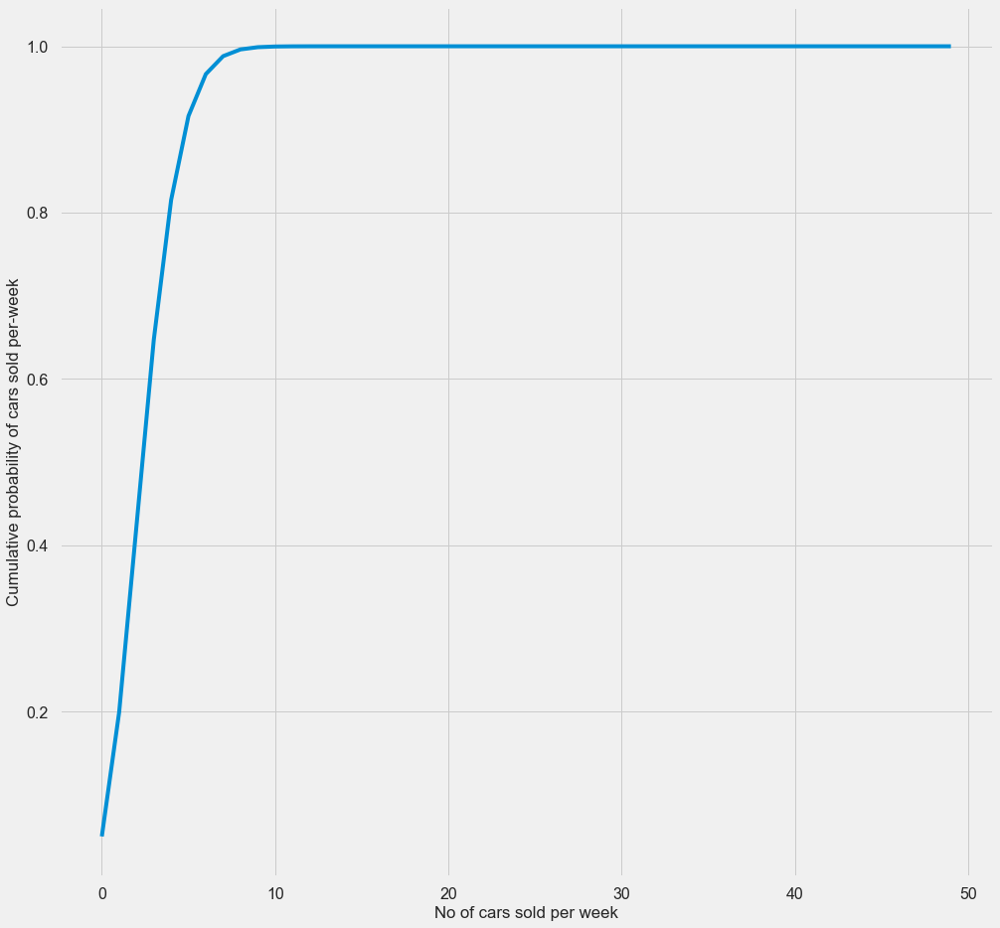

In [221]:
# C. Plot the poisson distribution function for cumulative probability of cars sold per-week vs number of cars sold per week.
n = np.arange(0, 50)
#poisson = stats.poisson.pmf(n, 3)
poisson = stats.poisson.cdf(n,3)



plt.figure(figsize=(15,15))
plt.xlabel('No of cars sold per week')
plt.ylabel('Cumulative probability of cars sold per-week')
plt.plot(poisson)


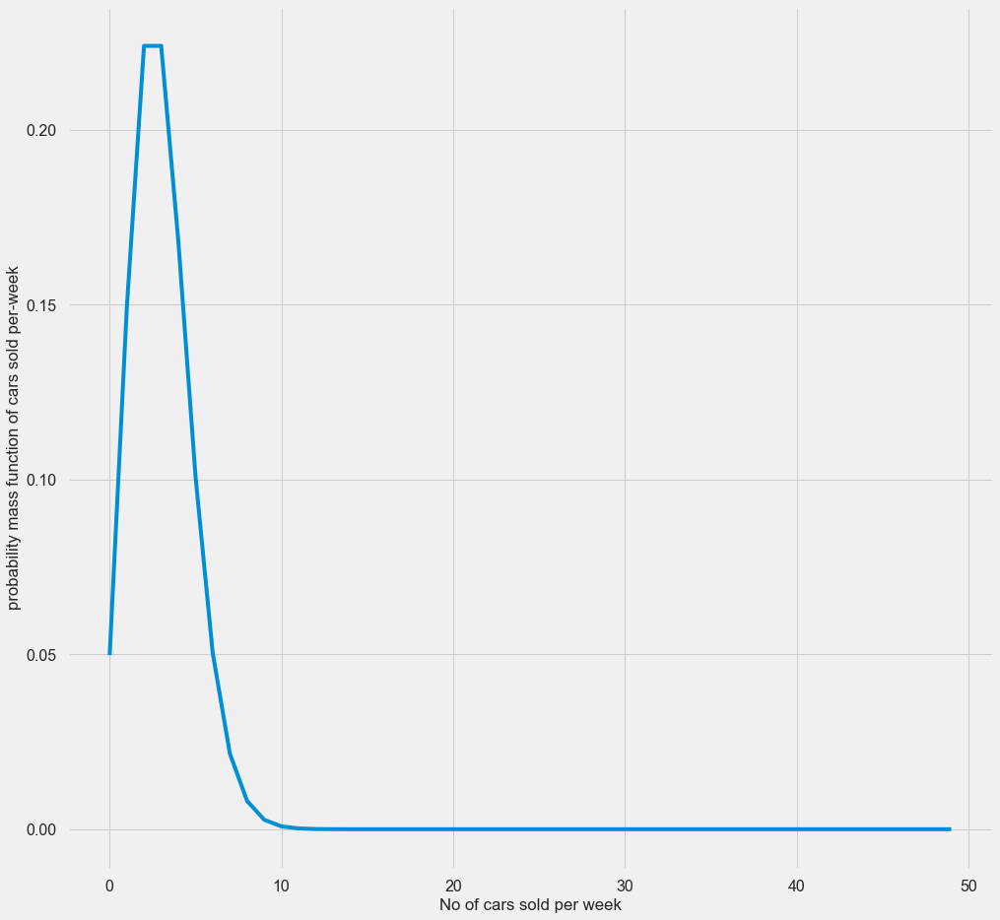

In [222]:
n = np.arange(0, 50)
poisson = stats.poisson.pmf(n, 3)
#poisson = stats.poisson.cdf(n,3)

plt.figure(figsize=(15,15))
plt.xlabel('No of cars sold per week')
plt.ylabel('probability mass function of cars sold per-week')
plt.plot(poisson)

## 4. Question: Accuracy in understanding orders for a speech based bot at a restaurant is important for the Company X which has designed, marketed and launched the product for a contactless delivery due to the COVID-19 pandemic. Recognition accuracy that measures the percentage of orders that are taken correctly is 86.8%. Suppose that you place order with the bot and two friends of yours independently place orders with the same bot. Answer the following questions.

A. What is the probability that all three orders will be recognised correctly?

B. What is the probability that none of the three orders will be recognised correctly?

C. What is the probability that at least two of the three orders will be recognised correctly?

Let X (placing orders on bot) be a random variable which follows Binomial Distribution with the parameters n = 3 and p = 0.868.

X ~ binomial (n=3,p=0.868)

In [223]:
n,p = 3,0.868
print('The total number of trials is',n,'and the probability of success at each trial is',p,'.')

The total number of trials is 3 and the probability of success at each trial is 0.868 .


## A. What is the probability that all three orders will be recognised correctly?

In [224]:
k = 3
print('The value of the random for which we are calculating the probability is',k,'.')

The value of the random for which we are calculating the probability is 3 .


In [225]:
print('Probability that that all three orders will be recognised correctly is',stats.binom.pmf(k,n,p),'.')

Probability that that all three orders will be recognised correctly is 0.653972032 .


## B. What is the probability that none of the three orders will be recognised correctly?

In [226]:
k_2 = 0
print('Probability that that none of the orders will be recognised correctly is',stats.binom.pmf(k_2,n,p),'.')

Probability that that none of the orders will be recognised correctly is 0.002299968 .


## C. What is the probability that at least two of the three orders will be recognised correctly?

In [227]:
print('We are going to sum the probability values of X=2 and X=3 ')

print('probability that at least two of the three orders will be recognised correctly is',
      stats.binom.pmf(2,n,p) + stats.binom.pmf(3,n,p))

We are going to sum the probability values of X=2 and X=3 
probability that at least two of the three orders will be recognised correctly is 0.9523279359999999


## 5. Question: A group of 300 professionals sat for a competitive exam. The results show the information of marks obtained by them have a mean of 60 and a standard deviation of 12. The pattern of marks follows a normal distribution. Answer the following questions.


A. What is the percentage of students who score more than 80.

B. What is the percentage of students who score less than 50.

C. What should be the distinction mark if the highest 10% of students are to be awarded distinction?


Let X (score of a student) be a random variable which follows Normal Distribution with the parameter $\mu$ = 60 and $\sigma$ = 12.

X ~ Normal ($\mu$ = 60 , $\sigma$ = 12)

## A. What is the percentage of students who score more than 80.

In [228]:
print('The percentage of students who score more than 80 is {} %'.format(np.round((1 - stats.norm.cdf(80,60,12)),5)*100))

The percentage of students who score more than 80 is 4.779 %


## B. What is the percentage of students who score less than 50.

In [229]:
print('The percentage of students who score less than 50 is {} %'.format(np.round(stats.norm.cdf(50,60,12),5)*100))

The percentage of students who score less than 50 is 20.233 %


## C. What should be the distinction mark if the highest 10% of students are to be awarded distinction?

In [230]:
print('The distinction mark if the highest 10% of students are to be awarded distinction :- ',np.round(stats.norm.ppf(0.90,60,12),3))

The distinction mark if the highest 10% of students are to be awarded distinction :-  75.379


## 6. Question: Explain 1 real life industry scenario [other than the ones mentioned above] where you can use the concepts learnt in this module of Applied statistics to get a data driven business solution.

Technology companies use the Poisson distribution to model the number of expected network failures per week.

For example, suppose a given company experiences an average of 1 network failure per week. We can use the Poisson distribution calculator to find the probability that the company experiences a certain number of network failures in a given week:

P(X = 0 failures) = 0.36788, P(X = 1 failure) = 0.36788, P(X = 2 failures) = 0.18394

And so on.

This gives the company an idea of how many failures are likely to occur each week.

===================================================================================================================================================================================

# Project Third Part

In [18]:
df = pd.read_csv("CompanyX_EU.csv")
df.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,2600Hz,2600hz.com,NaN,Disrupt SF 2013,Contestant,Operating
1,3DLT,3dlt.com,$630K,Disrupt NYC 2013,Contestant,Closed
2,3DPrinterOS,3dprinteros.com,NaN,Disrupt SF 2016,Contestant,Operating
3,3Dprintler,3dprintler.com,$1M,Disrupt NY 2016,Audience choice,Operating
4,42 Technologies,42technologies.com,NaN,Disrupt NYC 2013,Contestant,Operating


In [19]:
df.tail()

,Startup,Product,Funding,Event,Result,OperatingState
657,Zivity,zivity.com,$8M,TC40 2007,Contestant,Operating
658,Zmorph,zmorph3d.com,$1M,-,Audience choice,Operating
659,Zocdoc,zocdoc.com,$223M,TC40 2007,Contestant,Operating
660,Zula,zulaapp.com,$3.4M,Disrupt SF 2013,Audience choice,Operating
661,Zumper,zumper.com,$31.5M,Disrupt SF 2012,Finalist,Operating


In [20]:
df.shape

(662, 6)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 662 entries, 0 to 661
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Startup         662 non-null    object
 1   Product         656 non-null    object
 2   Funding         448 non-null    object
 3   Event           662 non-null    object
 4   Result          662 non-null    object
 5   OperatingState  662 non-null    object
dtypes: object(6)
memory usage: 31.2+ KB


In [22]:
df.describe()

,Startup,Product,Funding,Event,Result,OperatingState
count,662,656,448,662,662,662
unique,662,656,240,26,5,4
top,Angstro,teamstitch.com,$1M,TC50 2008,Contestant,Operating
freq,1,1,17,52,488,465


In [23]:
df.isnull().sum()

Startup             0
Product             6
Funding           214
Event               0
Result              0
OperatingState      0
dtype: int64

# Data preprocessing & visualisation:

## Dropping the null values

In [24]:
df.dropna(inplace=True)
df.isnull().sum()

Startup           0
Product           0
Funding           0
Event             0
Result            0
OperatingState    0
dtype: int64

In [25]:
df.shape

(446, 6)

## Convert Funding to numerical

In [26]:
df.columns

Index(['Startup', 'Product', 'Funding', 'Event', 'Result', 'OperatingState'], dtype='object')

In [27]:
df['Funding']

1        $630K
3          $1M
5       $19.3M
6         $29M
10       $1.8M
11         $1M
13         $1M
14       $750K
15      $17.9K
16      $11.6M
17     $929.2K
18      $12.2M
20       $1.9M
22         $4M
27         $3M
28       $225K
31        $24M
32       $746K
34       $600K
35       $7.1M
37       $4.5M
40      $50.9M
42       $8.3M
44         $4M
46      $12.3M
47         $1M
48       $190K
49        $40M
51       $520K
52       $2.9M
53       $320K
54       $1.7M
55        $20K
56       $205M
58      $16.5M
59       $2.8M
60       $125K
61       $350K
62      $20.8M
63       $675K
64       $6.5M
65         $2M
66       $118K
68         $4M
70      $20.5M
71       $7.2M
72       $2.3M
73       $212K
76         $7M
79       $8.1M
81       $8.5M
82       $325K
83        $20K
85       $150K
86         $5M
87        $60K
88       $8.8M
89       $120K
94         $2M
95       $2.3M
96       $3.1M
97       $5.5M
99       $4.5M
100      $2.2M
105      $496K
106      $1.4M
107      $

In [28]:
df.shape[0]

446

In [29]:
df  = df.reset_index()
df.head()

,index,Startup,Product,Funding,Event,Result,OperatingState
0,1,3DLT,3dlt.com,$630K,Disrupt NYC 2013,Contestant,Closed
1,3,3Dprintler,3dprintler.com,$1M,Disrupt NY 2016,Audience choice,Operating
2,5,5to1,5to1.com,$19.3M,TC50 2009,Contestant,Acquired
3,6,8 Securities,8securities.com,$29M,Disrupt Beijing 2011,Finalist,Operating
4,10,AdhereTech,adheretech.com,$1.8M,Hardware Battlefield 2014,Contestant,Operating


In [30]:
df.drop('index', axis=1, inplace=True)
df.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,$630K,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,$1M,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,$19.3M,TC50 2009,Contestant,Acquired
3,8 Securities,8securities.com,$29M,Disrupt Beijing 2011,Finalist,Operating
4,AdhereTech,adheretech.com,$1.8M,Hardware Battlefield 2014,Contestant,Operating


In [31]:
import re
(re.split('[K M $]',df['Funding'][45]))[1]

'7.2'

In [32]:
df['Funding_new'] = df['Funding']
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new
0,3DLT,3dlt.com,$630K,Disrupt NYC 2013,Contestant,Closed,$630K
1,3Dprintler,3dprintler.com,$1M,Disrupt NY 2016,Audience choice,Operating,$1M
2,5to1,5to1.com,$19.3M,TC50 2009,Contestant,Acquired,$19.3M
3,8 Securities,8securities.com,$29M,Disrupt Beijing 2011,Finalist,Operating,$29M
4,AdhereTech,adheretech.com,$1.8M,Hardware Battlefield 2014,Contestant,Operating,$1.8M


In [33]:
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new
0,3DLT,3dlt.com,$630K,Disrupt NYC 2013,Contestant,Closed,$630K
1,3Dprintler,3dprintler.com,$1M,Disrupt NY 2016,Audience choice,Operating,$1M
2,5to1,5to1.com,$19.3M,TC50 2009,Contestant,Acquired,$19.3M
3,8 Securities,8securities.com,$29M,Disrupt Beijing 2011,Finalist,Operating,$29M
4,AdhereTech,adheretech.com,$1.8M,Hardware Battlefield 2014,Contestant,Operating,$1.8M


In [34]:
curr_lst = []
for i in range(df.shape[0]):
    curr_lst.append(str(df['Funding_new'][i])[-1])

In [35]:
curr_lst

['K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'K',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'K',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'K',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'K',
 'K',
 'K',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'K',
 'K',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'M',
 'K',
 'K',
 'K',
 'B',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'K',
 'M',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'K',
 'K',
 'M',
 'K',
 'K',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M',
 'M'

In [36]:
curr_set = set(curr_lst)
curr_set

{'B', 'K', 'M'}

In [37]:
import re
for i in range(df.shape[0]):
    df['Funding'][i] = (re.split('[K M B $]',df['Funding'][i]))[1]
      
    if (str(df['Funding_new'][i])[-1] == 'K'):
        df['Funding'][i] = float((df['Funding'][i]))/1000
    elif (str(df['Funding_new'][i])[-1] == 'B'):
        df['Funding'][i] = float((df['Funding'][i]))*1000

df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,$630K
1,3Dprintler,3dprintler.com,1,Disrupt NY 2016,Audience choice,Operating,$1M
2,5to1,5to1.com,19.3,TC50 2009,Contestant,Acquired,$19.3M
3,8 Securities,8securities.com,29,Disrupt Beijing 2011,Finalist,Operating,$29M
4,AdhereTech,adheretech.com,1.8,Hardware Battlefield 2014,Contestant,Operating,$1.8M


In [38]:
df['Currency'] = curr_lst
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new,Currency
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,$630K,K
1,3Dprintler,3dprintler.com,1,Disrupt NY 2016,Audience choice,Operating,$1M,M
2,5to1,5to1.com,19.3,TC50 2009,Contestant,Acquired,$19.3M,M
3,8 Securities,8securities.com,29,Disrupt Beijing 2011,Finalist,Operating,$29M,M
4,AdhereTech,adheretech.com,1.8,Hardware Battlefield 2014,Contestant,Operating,$1.8M,M


In [39]:
df[df['Currency'] == 'B']

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new,Currency
102,Dropbox,dropbox.com,1700.0,TC50 2008,Contestant,Operating,$1.7B,B


In [40]:
df['Funding'] = df['Funding'].astype('float')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 446 entries, 0 to 445
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Startup         446 non-null    object 
 1   Product         446 non-null    object 
 2   Funding         446 non-null    float64
 3   Event           446 non-null    object 
 4   Result          446 non-null    object 
 5   OperatingState  446 non-null    object 
 6   Funding_new     446 non-null    object 
 7   Currency        446 non-null    object 
dtypes: float64(1), object(7)
memory usage: 28.0+ KB


## Plot box plot for funds in million.

<AxesSubplot:ylabel='Funding'>

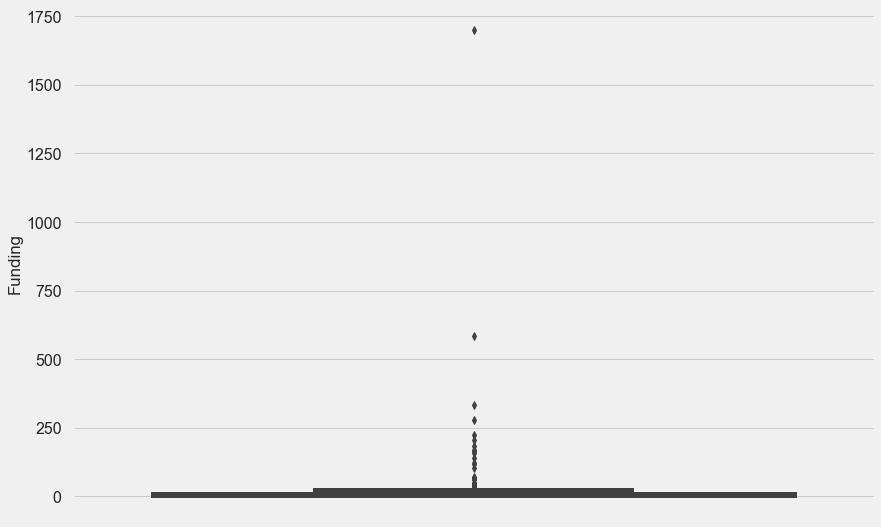

In [41]:
sns.boxplot(y = df['Funding'])

<AxesSubplot:xlabel='Funding', ylabel='Count'>

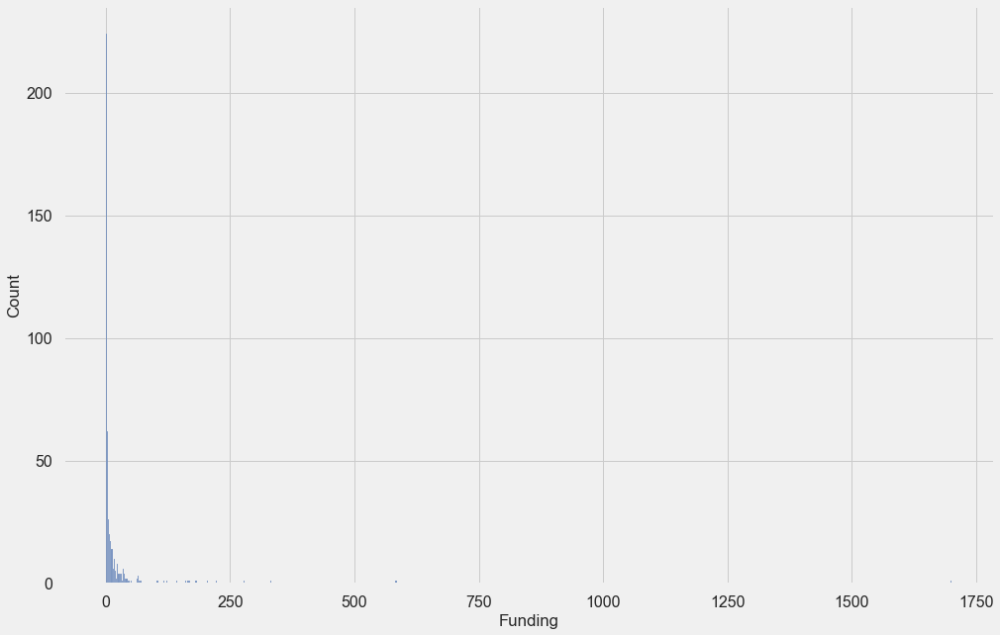

In [42]:
plt.figure(figsize=(15,10))
sns.histplot(df['Funding'])

## Get the lower fence from the box plot.

In [43]:
Q1 = df['Funding'].quantile(0.25)
Q1

0.74525

## Check number of outliers greater than upper fence.

In [44]:
Q3 = df['Funding'].quantile(0.75)
Q3

9.475

In [45]:
Upper_fence = Q3 + 1.5 * (Q3-Q1)
Lower_fence = Q1 - 1.5 * (Q3-Q1)
print('Upper_fence:- ', Upper_fence, 'Lower_fence:- ', Lower_fence)

Upper_fence:-  22.569625 Lower_fence:-  -12.349374999999998


In [46]:
df.to_csv('Company_Cleaned.csv')

In [47]:
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new,Currency
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,$630K,K
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,$1M,M
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,$19.3M,M
3,8 Securities,8securities.com,29.00,Disrupt Beijing 2011,Finalist,Operating,$29M,M
4,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,$1.8M,M


In [48]:
#positions = []
positions = np.where(df['Funding'] > Upper_fence)
positions

(array([  3,  16,  21,  27,  33,  67,  71,  82,  84,  85,  87,  88, 102,
        111, 117, 121, 122, 127, 129, 140, 144, 146, 153, 157, 183, 187,
        189, 192, 205, 208, 212, 221, 230, 260, 263, 264, 267, 286, 291,
        294, 311, 318, 365, 371, 375, 389, 395, 400, 403, 409, 418, 432,
        433, 436, 437, 438, 439, 440, 443, 445], dtype=int64),)

In [49]:
positions = positions[0].tolist()

## Check number of outliers greater than upper fence.

In [50]:
len(positions)

60

There are 60 outliers in Funding column, which are greater than upper fence value.

In [51]:
df.shape

(446, 8)

In [52]:
df.drop(positions,axis = 0, inplace = True)
df.shape

(386, 8)

In [53]:
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Funding_new,Currency
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,$630K,K
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,$1M,M
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,$19.3M,M
4,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,$1.8M,M
5,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed,$1M,M


In [54]:
df = df.reset_index()
df.head()

,index,Startup,Product,Funding,Event,Result,OperatingState,Funding_new,Currency
0,0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,$630K,K
1,1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,$1M,M
2,2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,$19.3M,M
3,4,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,$1.8M,M
4,5,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed,$1M,M


In [55]:
df.drop(['index','Currency','Funding_new'],axis=1, inplace=True)
df.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired
3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating
4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed


<AxesSubplot:ylabel='Funding'>

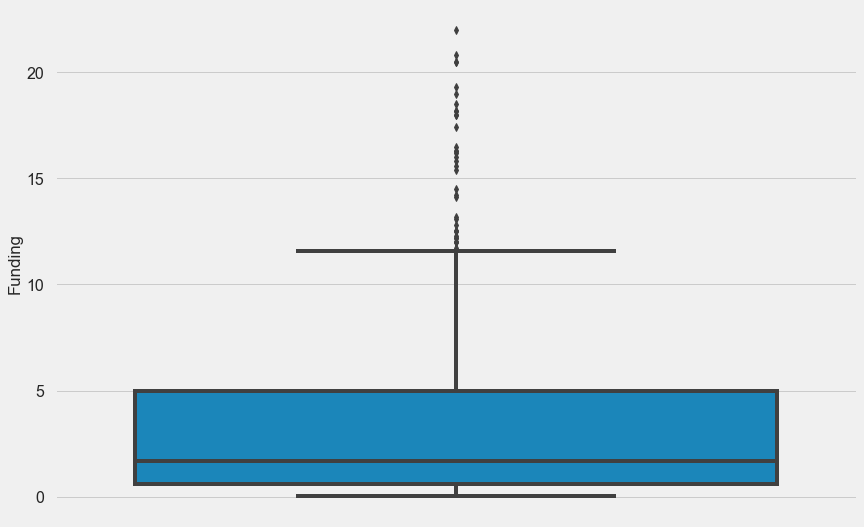

In [56]:
sns.boxplot(y = df['Funding'])

In [57]:
Q1 = df['Funding'].quantile(0.25)
Q3 = df['Funding'].quantile(0.75)

Upper_fence = Q3 + 1.5 * (Q3-Q1)
Lower_fence = Q1 - 1.5 * (Q3-Q1)
print('Upper_fence after removing outliers:- ', Upper_fence, 'Lower_fence after removing outliers:- ', Lower_fence)

Upper_fence after removing outliers:-  11.600000000000001 Lower_fence after removing outliers:-  -6.000000000000001


## Check frequency of the OperatingState features classes.

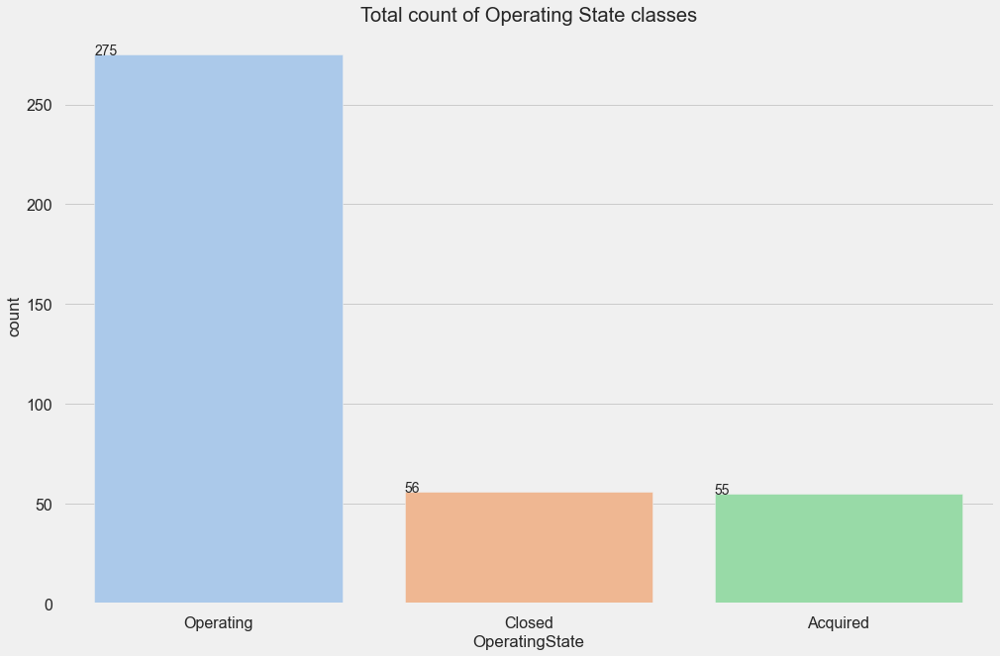

In [58]:
# Countof OperatingState classes.
plt.figure(figsize=(15,10))
sns.set_palette("pastel")
ax = sns.countplot(x="OperatingState", data=df, 
                   order = df['OperatingState'].value_counts().index)
plt.title('Total count of Operating State classes')
for p in ax.patches:
        ax.annotate('{:}'.format(p.get_height()), (p.get_x(), p.get_height()))

## Plot a distribution plot for Funds in million.

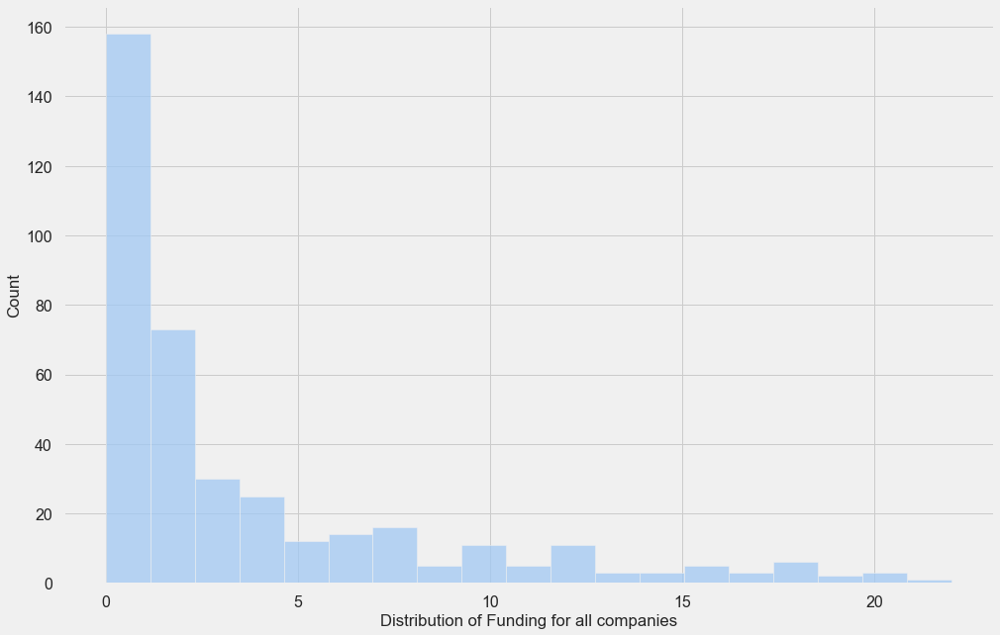

In [59]:
plt.figure(figsize=(15,10))
sns.histplot(df['Funding'])
plt.xlabel('Distribution of Funding for all companies')
plt.show()

## Funding density plot!

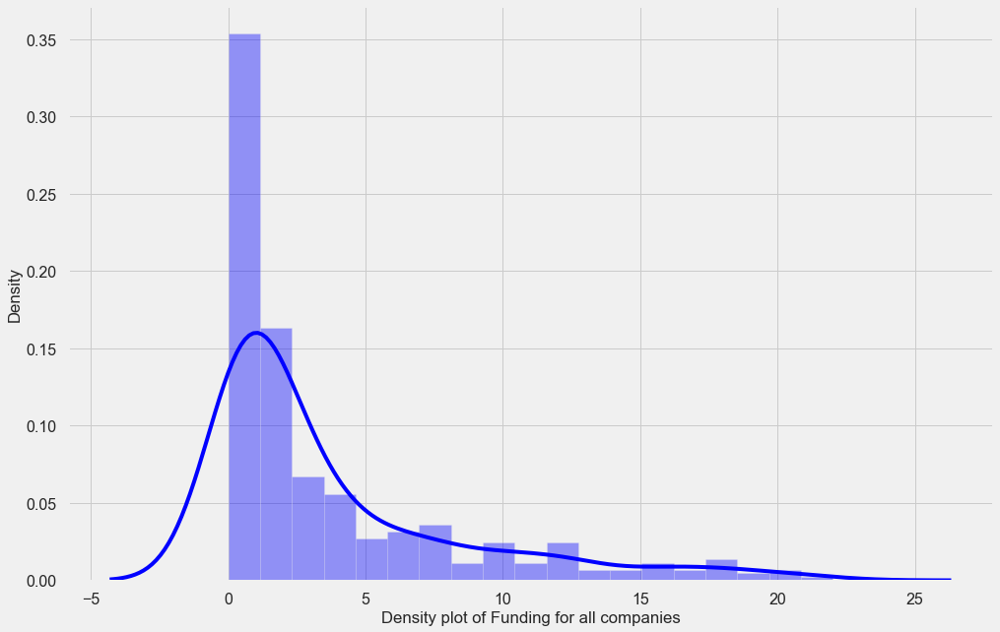

In [60]:

#Univariate Histograms to see the distributions: Funding
plt.figure(figsize=(15,10))
sns.distplot(df['Funding'],color="blue")
plt.xlabel('Density plot of Funding for all companies')
plt.show()

## Plot distribution plots for companies still operating and companies that closed

For operating companies

In [61]:
df_operating = df[df['OperatingState'] == 'Operating']
df_operating.head()

,Startup,Product,Funding,Event,Result,OperatingState
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating


In [62]:
df_operating.shape

(275, 6)

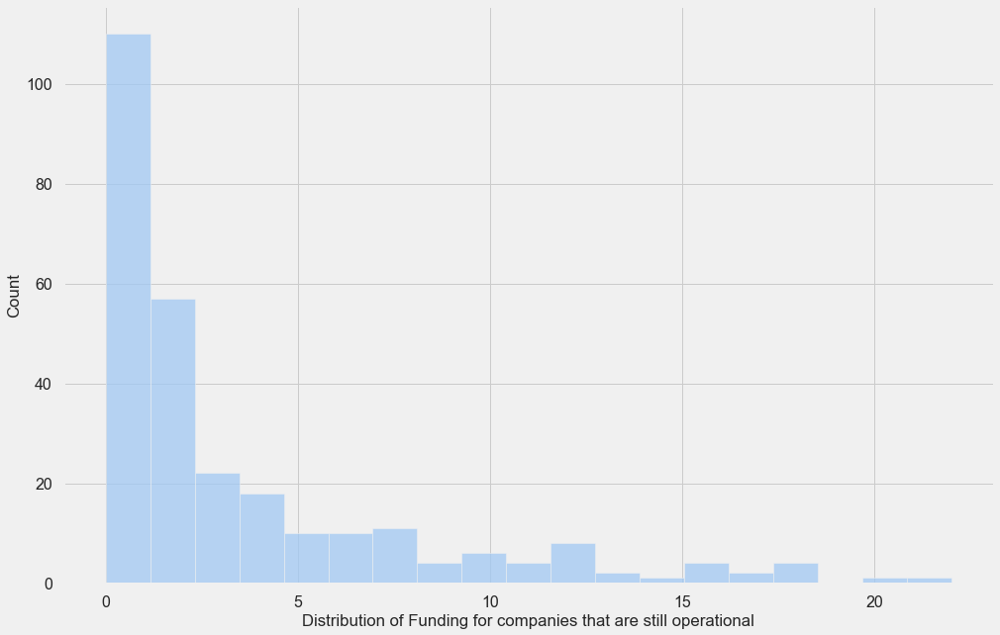

In [63]:
plt.figure(figsize=(15,10))
sns.histplot(df_operating['Funding'])
plt.xlabel('Distribution of Funding for companies that are still operational')
plt.show()

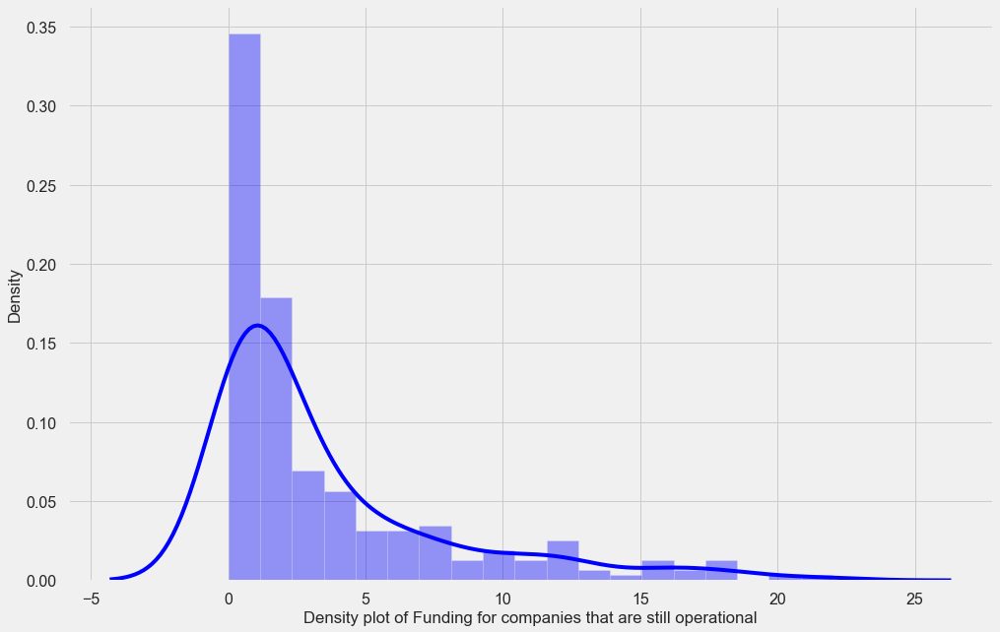

In [64]:
#Univariate Histograms to see the distributions: Funding for opearional companies.
plt.figure(figsize=(15,10))
sns.distplot(df_operating['Funding'],color="blue")
plt.xlabel('Density plot of Funding for companies that are still operational')
plt.show()

For closed companies

In [65]:
df_closed = df[df['OperatingState'] == 'Closed']
df_closed.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed
11,Akoha,akoha.com,1.9000,TC50 2008,Contestant,Closed
16,Appbistro,appbistro.com,0.6000,Disrupt NYC 2010,Contestant,Closed


In [66]:
df_closed.shape


(56, 6)

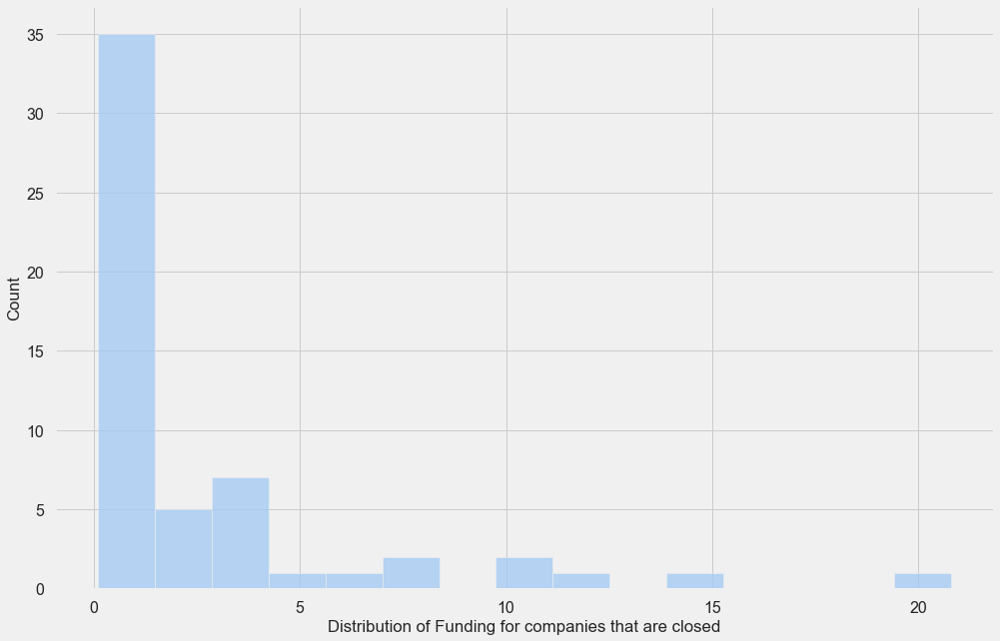

In [67]:
plt.figure(figsize=(15,10))
sns.histplot(df_closed['Funding'])
plt.xlabel('Distribution of Funding for companies that are closed')
plt.show()

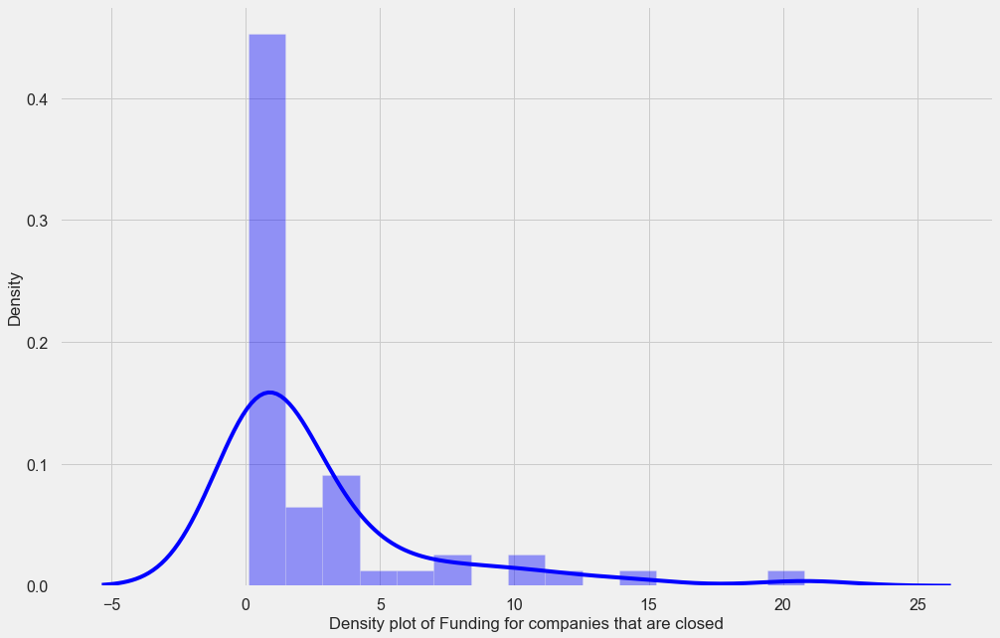

In [68]:
#Univariate Histograms to see the distributions: Funding for closed companies.
plt.figure(figsize=(15,10))
sns.distplot(df_closed['Funding'],color="blue")
plt.xlabel('Density plot of Funding for companies that are closed')
plt.show()

# Statistical analysis:

## Is there any significant difference between Funds raised by companies that are still operating vs companies that closed down?

Write the null hypothesis and alternative hypothesis.

Test for significance and conclusion


In [69]:
df_operating.head()

,Startup,Product,Funding,Event,Result,OperatingState
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating


In [70]:
df_closed.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed
11,Akoha,akoha.com,1.9000,TC50 2008,Contestant,Closed
16,Appbistro,appbistro.com,0.6000,Disrupt NYC 2010,Contestant,Closed


In [71]:
from   scipy.stats               import ttest_1samp, ttest_ind

### Step 1: Define null and alternative hypotheses

In testing whether the mean Funds raised by companies are same for the still operating vs companies that closed down, the null hypothesis states that the mean Funds raised by companies are same, $\mu{A}$ equals $\mu{B}$. The alternative hypothesis states that the mean Funds raised by companies are same are different, $\mu{A}$ is not equal to $\mu{B}$.

* $H_0$: $\mu{A}$ - $\mu{B}$ =      0 i.e        $\mu{A}$ = $\mu{B}$
* $H_A$: $\mu{A}$ - $\mu{B}$ $\neq$  0 i.e      $\mu{A}$ $\neq$ $\mu{B}$

### Step 2: Decide the significance level

Here we select $\alpha$ = 0.05 and the population standard deviation is not known.

### Step 3: Identify the test statistic

* We have two samples and we do not know the population standard deviation.
* Sample sizes for both samples are not same, t-test can handle unequal sample sizes.
* The sample is a large sample, n > 30 for both the samples. So you use the t distribution and the $t_{STAT}$ test statistic for two sample unpaired test.

** We use the scipy.stats.ttest_ind to calculate the t-test for the means of TWO INDEPENDENT samples of scores given the two sample observations. This function returns t statistic and two-tailed p value.**

** This is a two-sided test for the null hypothesis that 2 independent samples have identical average (expected) values. This test assumes that the populations have identical variances.**

In [72]:
t_statistic, p_value  = ttest_ind(df_operating['Funding'],df_closed['Funding'])
print('tstat',t_statistic)    
print('P Value',p_value)    

tstat 1.3039132895334589
P Value 0.1931747168826862


In [73]:
# p_value > 0.05 => Null hypothesis:
# they have the same mean at the 5% significance level
print ("two-sample t-test p-value=", p_value)

alpha_level = 0.05

if p_value < alpha_level:
    print('We have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that the mean Funds raised by companies which are operating and the ones closed are not same..')
else:
    print('We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis')
    print('We conclude that the mean Funds raised by companies which are operating and the ones closed are same.')

two-sample t-test p-value= 0.1931747168826862
We do not have enough evidence to reject the null hypothesis in favour of alternative hypothesis
We conclude that the mean Funds raised by companies which are operating and the ones closed are same.


## Make a copy of the original data frame.

In [74]:
df_copy = df.copy()
df_copy.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired
3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating
4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed


## Check frequency distribution of Result variable.

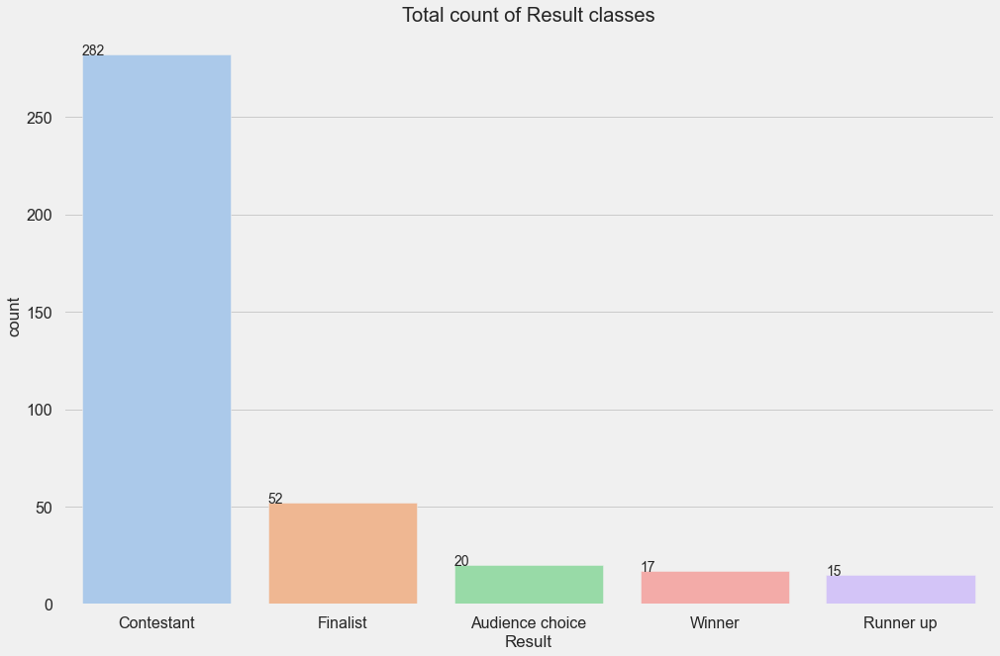

In [75]:
# Countof OperatingState classes.
plt.figure(figsize=(15,10))
sns.set_palette("pastel")
ax = sns.countplot(x="Result", data=df, 
                   order = df['Result'].value_counts().index)
plt.title('Total count of Result classes')
for p in ax.patches:
        ax.annotate('{:}'.format(p.get_height()), (p.get_x(), p.get_height()))

## Calculate percentage of winners that are still operating and percentage of contestants that are still operating

In [76]:
df_operating.shape

(275, 6)

In [77]:
df_operating.head()

,Startup,Product,Funding,Event,Result,OperatingState
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating


In [78]:
df_operating[df_operating['Result'] == 'Winner']

,Startup,Product,Funding,Event,Result,OperatingState
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
74,Crate.io,crate.io,8.1000,Disrupt EU 2014,Winner,Operating
142,Hello Alfred,helloalfred.com,12.5000,Disrupt SF 2014,Winner,Operating
163,Jukedeck,jukedeck.com,3.8000,Disrupt London 2015,Winner,Operating
174,Koto Labs,koto.io,0.7170,Hardware Battlefield 2014,Winner,Operating
180,Liquidity Nanotech Corporation,liquico.com,10.6000,Disrupt NY 2015,Winner,Operating
200,Mobalytics,mobalyticshq.com,2.6000,Disrupt SF 2016,Winner,Operating
215,Nima,nimasensor.com,13.2000,Hardware Battlefield 2016,Winner,Operating
278,Seenit,seenit.io,1.4000,Disrupt London 2016,Winner,Operating
288,Shaker,atshaker.com,18.0000,Disrupt SF 2011,Winner,Operating


In [79]:
df_operating[df_operating['Result'] == 'Winner'].shape

(12, 6)

In [80]:
#There are 12 winners out of all the companies that are operating!
percentage_winners_operating = (12/275) * 100
print("The % of winners that are still operating is {} %".format(np.round(percentage_winners_operating,2)))

The % of winners that are still operating is 4.36 %


In [81]:
df_operating[df_operating['Result'] == 'Contestant'].shape

(194, 6)

In [82]:
#There are 194 contestants out of all the companies that are operating!
percentage_cont_operating = (194/275) * 100
print("The % of contestants that are still operating is {} %".format(np.round(percentage_cont_operating,2)))

The % of contestants that are still operating is 70.55 %


## Write your hypothesis comparing the proportion of companies that are operating between winners and contestants:
Write the null hypothesis and alternative hypothesis.


Test for significance and conclusion

### Step 1: Define null and alternative hypotheses

In testing whether the proportion of companies that are operating between winners and contestants, the null hypothesis states that the proportion of companies that are operating between winners and contestants are same, Prop(A) equals Prop(B). 

The alternative hypothesis states that the proportion of companies that are operating between winners and contestants are different, Prop(A) is not equal to Prop(B).


### Step 2: Decide the significance level

Here we select $\alpha$ = 0.05.

### Step 3: Identify the test statistic

** We use the proportions_ztest to calculate the z-test for the proportions of TWO INDEPENDENT samples of scores given the two sample observations. This function returns z statistic and two-tailed p value.**


In [83]:
from statsmodels.stats.proportion import proportions_ztest
import numpy as np

# can we assume anything from our sample
significance = 0.05


winners, operating_comp = (12, 275)
contestants, operating_comp = (194, 275)
# check our sample against Ho for Ha != Ho

successes = np.array([winners, contestants])
samples = np.array([operating_comp, operating_comp])


stat, p_value = proportions_ztest(count=successes, nobs=samples,  alternative='two-sided')

# report
print('z_stat: %0.3f, p_value: %0.3f' % (stat, p_value))
if p_value > significance:
   print ("Fail to reject the null hypothesis - the proportion of companies that are operating between winners and contestants are same")
else:
   print ("Reject the null hypothesis - the proportion of companies that are operating between winners and contestants are not same")

z_stat: -16.034, p_value: 0.000
Reject the null hypothesis - the proportion of companies that are operating between winners and contestants are not same


## Check distribution of the Event variable.

In [84]:
df.head()

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired
3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating
4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed


## Dataframe of events and their number of occurences 

In [85]:
pd.DataFrame(df['Event'].value_counts())

,Event
TC50 2008,25
TC40 2007,22
Disrupt NY 2015,21
Disrupt SF 2011,19
TC50 2009,19
Disrupt SF 2015,19
Disrupt SF 2014,19
Disrupt NYC 2013,19
Disrupt SF 2013,19
Disrupt NYC 2012,19


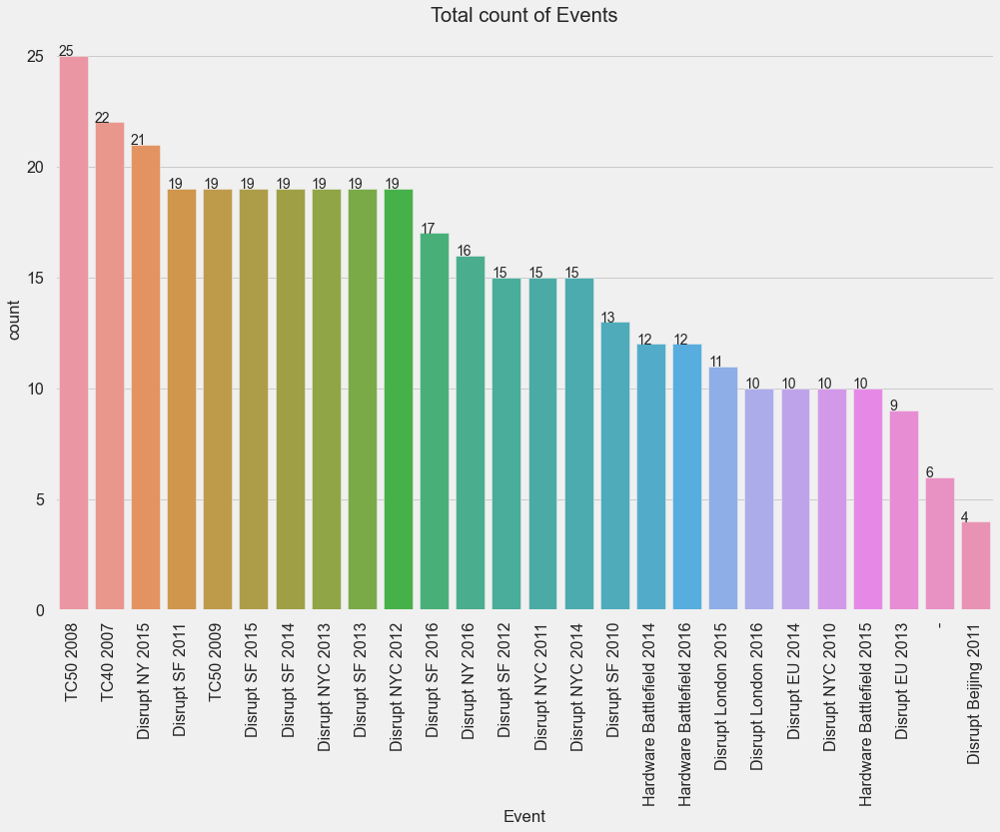

In [86]:
plt.figure(figsize=(15,10))
sns.set_palette("pastel")
ax = sns.countplot(x="Event", data=df, 
                   order = df['Event'].value_counts().index)
plt.title('Total count of Events')
plt.xticks(rotation = 90)
for p in ax.patches:
        ax.annotate('{:}'.format(p.get_height()), (p.get_x(), p.get_height()))

In [87]:
pd.DataFrame(df['Event'].value_counts()).shape

(26, 1)

### There are 26 categories of events present

## Select only the Event that has disrupt keyword from 2013 onwards.

In [88]:
df.head(10)

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,19.3000,TC50 2009,Contestant,Acquired
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating
8,Aircall,aircall.io,11.6000,Disrupt SF 2015,Contestant,Operating
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed


In [89]:
## Dropping the entries where '-' is present in Events field.

indexes = np.where(df['Event'] == '-')
indexes = indexes[0].tolist()
indexes

[38, 170, 242, 298, 357, 384]

In [90]:
df.drop(indexes, axis = 0, inplace = True)
df.head(40)

,Startup,Product,Funding,Event,Result,OperatingState
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating
2,5to1,5to1.com,19.3000,TC50 2009,Contestant,Acquired
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating
8,Aircall,aircall.io,11.6000,Disrupt SF 2015,Contestant,Operating
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed


In [91]:
(df['Event'][1].split(' '))[-1]

'2016'

In [92]:
df['Event_year'] = ""
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Event_year
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,
3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,
4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed,


In [93]:
df = df.reset_index()
df.head()

,index,Startup,Product,Funding,Event,Result,OperatingState,Event_year
0,0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,
1,1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,
2,2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,
3,3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,
4,4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed,


In [94]:
## Extracting the year from event column.

for i in range(df.shape[0]):
    df['Event_year'][i] = (df['Event'][i].split(' '))[-1]
df.head(20)

,index,Startup,Product,Funding,Event,Result,OperatingState,Event_year
0,0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed,2013
1,1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating,2016
2,2,5to1,5to1.com,19.3000,TC50 2009,Contestant,Acquired,2009
3,3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating,2014
4,4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed,2008
5,5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating,2015
6,6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating,2016
7,7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating,2014
8,8,Aircall,aircall.io,11.6000,Disrupt SF 2015,Contestant,Operating,2015
9,9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed,2014


In [95]:
df.drop('index', axis=1, inplace=True)

In [96]:
df['Disrupt_present'] = ""
df.head()

,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present
0,3DLT,3dlt.com,0.63,Disrupt NYC 2013,Contestant,Closed,2013,
1,3Dprintler,3dprintler.com,1.00,Disrupt NY 2016,Audience choice,Operating,2016,
2,5to1,5to1.com,19.30,TC50 2009,Contestant,Acquired,2009,
3,AdhereTech,adheretech.com,1.80,Hardware Battlefield 2014,Contestant,Operating,2014,
4,AdRocket,adrocket.com,1.00,TC50 2008,Contestant,Closed,2008,


In [97]:
## Extracting the 'Disrupt' from event column.

for i in range(df.shape[0]):
    if (df['Event'][i].split(' '))[0] == 'Disrupt':
        
        df['Disrupt_present'][i] = 'Yes'
    else:
        df['Disrupt_present'][i] = 'No'
df.head(20)

,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed,2013,Yes
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating,2016,Yes
2,5to1,5to1.com,19.3000,TC50 2009,Contestant,Acquired,2009,No
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating,2014,No
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed,2008,No
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating,2015,Yes
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating,2016,Yes
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating,2014,No
8,Aircall,aircall.io,11.6000,Disrupt SF 2015,Contestant,Operating,2015,Yes
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed,2014,No


In [98]:
df[df['Disrupt_present'] == 'No']

,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present
2,5to1,5to1.com,19.3000,TC50 2009,Contestant,Acquired,2009,No
3,AdhereTech,adheretech.com,1.8000,Hardware Battlefield 2014,Contestant,Operating,2014,No
4,AdRocket,adrocket.com,1.0000,TC50 2008,Contestant,Closed,2008,No
7,AirBoxLab,foobot.io,0.0179,Hardware Battlefield 2014,Contestant,Operating,2014,No
9,AirDroids,airdroids.com,0.9292,Hardware Battlefield 2014,Contestant,Closed,2014,No
11,Akoha,akoha.com,1.9000,TC50 2008,Contestant,Closed,2008,No
14,Angstro,angst.ro,0.2250,TC50 2008,Contestant,Acquired,2008,No
15,App2you,app2you.com,0.7460,TC40 2007,Contestant,Operating,2007,No
20,Atlas Wearables,atlaswearables.com,4.0000,Hardware Battlefield 2014,Finalist,Operating,2014,No
27,BeFunky,befunky.com,1.7000,TC40 2007,Contestant,Operating,2007,No


In [99]:
df_disrupt_from2013 = df[(df['Disrupt_present'] == 'Yes') & (df['Event_year'] >= '2013')]
df_disrupt_from2013

,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present
0,3DLT,3dlt.com,0.6300,Disrupt NYC 2013,Contestant,Closed,2013,Yes
1,3Dprintler,3dprintler.com,1.0000,Disrupt NY 2016,Audience choice,Operating,2016,Yes
5,Agrilyst,agrilyst.com,1.0000,Disrupt SF 2015,Winner,Operating,2015,Yes
6,Aiden,aiden.ai,0.7500,Disrupt London 2016,Contestant,Operating,2016,Yes
8,Aircall,aircall.io,11.6000,Disrupt SF 2015,Contestant,Operating,2015,Yes
10,AirHelp,airhelp.com,12.2000,Disrupt NYC 2014,Contestant,Operating,2014,Yes
19,asap54.com,asap54.com,8.3000,Disrupt EU 2013,Runner up,Operating,2013,Yes
21,Ava,avawomen.com,12.3000,Disrupt SF 2015,Contestant,Operating,2015,Yes
24,Beam,beam.pro,0.5200,Disrupt NY 2016,Winner,Acquired,2016,Yes
25,Beartooth,beartooth.com,2.9000,Disrupt SF 2014,Contestant,Operating,2014,Yes


## Write and perform your hypothesis along with significance test comparing the funds raised by companies across NY, SF and EU events from 2013 onwards.

We will perform ANOVA for the analysis

In [100]:
df_disrupt_from2013 = df_disrupt_from2013.reset_index()

In [101]:
df_disrupt_from2013['City'] = ""

In [102]:
## Extracting the city from event column.

for i in range(df_disrupt_from2013.shape[0]):
    df_disrupt_from2013['City'][i] = (df_disrupt_from2013['Event'][i].split(' '))[1]
df_disrupt_from2013.head(20)

,index,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present,City
0,0,3DLT,3dlt.com,0.630,Disrupt NYC 2013,Contestant,Closed,2013,Yes,NYC
1,1,3Dprintler,3dprintler.com,1.000,Disrupt NY 2016,Audience choice,Operating,2016,Yes,NY
2,5,Agrilyst,agrilyst.com,1.000,Disrupt SF 2015,Winner,Operating,2015,Yes,SF
3,6,Aiden,aiden.ai,0.750,Disrupt London 2016,Contestant,Operating,2016,Yes,London
4,8,Aircall,aircall.io,11.600,Disrupt SF 2015,Contestant,Operating,2015,Yes,SF
5,10,AirHelp,airhelp.com,12.200,Disrupt NYC 2014,Contestant,Operating,2014,Yes,NYC
6,19,asap54.com,asap54.com,8.300,Disrupt EU 2013,Runner up,Operating,2013,Yes,EU
7,21,Ava,avawomen.com,12.300,Disrupt SF 2015,Contestant,Operating,2015,Yes,SF
8,24,Beam,beam.pro,0.520,Disrupt NY 2016,Winner,Acquired,2016,Yes,NY
9,25,Beartooth,beartooth.com,2.900,Disrupt SF 2014,Contestant,Operating,2014,Yes,SF


In [103]:
df_disrupt_from2013.drop('index', axis = 1, inplace = True)

In [104]:
df_disrupt_from2013.head(20)

,Startup,Product,Funding,Event,Result,OperatingState,Event_year,Disrupt_present,City
0,3DLT,3dlt.com,0.630,Disrupt NYC 2013,Contestant,Closed,2013,Yes,NYC
1,3Dprintler,3dprintler.com,1.000,Disrupt NY 2016,Audience choice,Operating,2016,Yes,NY
2,Agrilyst,agrilyst.com,1.000,Disrupt SF 2015,Winner,Operating,2015,Yes,SF
3,Aiden,aiden.ai,0.750,Disrupt London 2016,Contestant,Operating,2016,Yes,London
4,Aircall,aircall.io,11.600,Disrupt SF 2015,Contestant,Operating,2015,Yes,SF
5,AirHelp,airhelp.com,12.200,Disrupt NYC 2014,Contestant,Operating,2014,Yes,NYC
6,asap54.com,asap54.com,8.300,Disrupt EU 2013,Runner up,Operating,2013,Yes,EU
7,Ava,avawomen.com,12.300,Disrupt SF 2015,Contestant,Operating,2015,Yes,SF
8,Beam,beam.pro,0.520,Disrupt NY 2016,Winner,Acquired,2016,Yes,NY
9,Beartooth,beartooth.com,2.900,Disrupt SF 2014,Contestant,Operating,2014,Yes,SF


In [105]:
# Funds raised by companies from SF

SF_Funds = df_disrupt_from2013[df_disrupt_from2013['City'] == 'SF']['Funding']
SF_Funds

2       1.0000
4      11.6000
7      12.3000
9       2.9000
10      0.3200
14      0.6750
16      0.1180
19      2.3000
20      7.0000
21      8.8000
25      0.4960
27      2.0000
30      0.9250
32      6.8000
34      0.1000
39     10.1000
40      0.4850
42      3.0000
43      3.0000
44      0.1200
47      5.0000
49      1.2000
52      0.0600
53      6.5000
56     11.3000
57     12.5000
58      1.9000
67     12.5000
71      1.0000
75      1.0000
77     11.7000
82      1.8000
84      2.0000
85      1.0000
89      2.3000
91      3.2000
94      0.8000
95      2.6000
96      3.3000
98      1.2000
108     0.8920
113     1.5000
120     0.5000
121     1.7000
122     0.1200
124     0.0200
125     6.0000
127     0.1000
128     0.1450
131     1.2000
132     0.9560
133     3.0000
139     2.0000
140     6.0000
141     0.1650
145     0.3500
150     0.1180
151     0.0200
153     2.3000
154     1.3000
155     0.6000
156     0.1200
158     0.3238
159     5.1000
160     1.0000
162     1.5000
166     2.

In [106]:
# Funds raised by companies from NY

NY_Funds = df_disrupt_from2013[df_disrupt_from2013['City'] == 'NY']['Funding']
NY_Funds

1       1.0000
8       0.5200
11      0.0200
12      2.8000
13      0.1250
15      6.5000
18      7.2000
23      2.3000
28      2.6000
33      7.3000
48      0.6500
62     10.7000
69      3.2000
70      0.1950
87     10.6000
90      0.2500
100     0.1000
101     2.8000
104     0.1000
110     7.2000
112     2.2000
115     0.0500
117     0.7550
118     0.5000
126     0.0203
129     7.0000
130     5.0000
135     1.5000
138     0.5900
147     1.5000
152     2.6000
163     1.9000
169     1.0000
171     2.3000
175     0.0857
178     2.5000
180     0.0500
Name: Funding, dtype: float64

In [107]:
# Funds raised by companies from NY

EU_Funds = df_disrupt_from2013[df_disrupt_from2013['City'] == 'EU']['Funding']
EU_Funds

6       8.3000
29      0.4115
31      8.1000
35      1.3000
59      0.3346
68      1.1000
72     18.2000
73      0.3550
80      4.4000
88      2.0000
99      0.2750
103    10.7000
106     0.5000
107     0.6514
123     0.9480
134     7.7000
144     1.4000
149     0.6844
174     0.2750
Name: Funding, dtype: float64

In [108]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import _get_covariance, anova_lm

## Preparing the dataset for ANOVA analysis

In [109]:
ANOVA_df = pd.DataFrame(SF_Funds)
ANOVA_df['City'] = ""
ANOVA_df

,Funding,City
2,1.0000,
4,11.6000,
7,12.3000,
9,2.9000,
10,0.3200,
14,0.6750,
16,0.1180,
19,2.3000,
20,7.0000,
21,8.8000,


In [110]:
ANOVA_df.reset_index()
ANOVA_df.head()

,Funding,City
2,1.00,
4,11.60,
7,12.30,
9,2.90,
10,0.32,


In [111]:
ANOVA_df['City'] = 'SF'
ANOVA_df

,Funding,City
2,1.0000,SF
4,11.6000,SF
7,12.3000,SF
9,2.9000,SF
10,0.3200,SF
14,0.6750,SF
16,0.1180,SF
19,2.3000,SF
20,7.0000,SF
21,8.8000,SF


In [112]:
ANOVA_df2 = pd.DataFrame(NY_Funds)
ANOVA_df2['City'] = 'NY'
ANOVA_df2

,Funding,City
1,1.0000,NY
8,0.5200,NY
11,0.0200,NY
12,2.8000,NY
13,0.1250,NY
15,6.5000,NY
18,7.2000,NY
23,2.3000,NY
28,2.6000,NY
33,7.3000,NY


In [113]:
ANOVA_df3 = pd.DataFrame(EU_Funds)
ANOVA_df3['City'] = 'EU'
ANOVA_df3

,Funding,City
6,8.3000,EU
29,0.4115,EU
31,8.1000,EU
35,1.3000,EU
59,0.3346,EU
68,1.1000,EU
72,18.2000,EU
73,0.3550,EU
80,4.4000,EU
88,2.0000,EU


In [114]:
final_ANOVA = pd.concat([ANOVA_df,ANOVA_df2, ANOVA_df3])
final_ANOVA

,Funding,City
2,1.0000,SF
4,11.6000,SF
7,12.3000,SF
9,2.9000,SF
10,0.3200,SF
14,0.6750,SF
16,0.1180,SF
19,2.3000,SF
20,7.0000,SF
21,8.8000,SF


In [115]:
final_ANOVA = final_ANOVA.reset_index()


In [116]:
final_ANOVA.drop('index', inplace= True, axis=1)
final_ANOVA

,Funding,City
0,1.0000,SF
1,11.6000,SF
2,12.3000,SF
3,2.9000,SF
4,0.3200,SF
5,0.6750,SF
6,0.1180,SF
7,2.3000,SF
8,7.0000,SF
9,8.8000,SF


In [117]:
final_ANOVA['City'] = pd.Categorical(final_ANOVA['City']).codes

final_ANOVA

,Funding,City
0,1.0000,2
1,11.6000,2
2,12.3000,2
3,2.9000,2
4,0.3200,2
5,0.6750,2
6,0.1180,2
7,2.3000,2
8,7.0000,2
9,8.8000,2


In [118]:
final_ANOVA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Funding  130 non-null    float64
 1   City     130 non-null    int8   
dtypes: float64(1), int8(1)
memory usage: 1.3 KB


In [119]:
final_ANOVA['City_Name'] = ""
for i in range(final_ANOVA.shape[0]):
    if (final_ANOVA['City'][i]) == 0:
        #print('0 ',final_ANOVA['City'][i])
        final_ANOVA['City_Name'][i] = 'EU'
    elif (final_ANOVA['City'][i]) == 1:
        #print('1 ',final_ANOVA['City'][i])
        final_ANOVA['City_Name'][i] = 'NY'
    elif (final_ANOVA['City'][i]) == 2:
        #print('2 ',final_ANOVA['City'][i])
        final_ANOVA['City_Name'][i] = 'SF'
final_ANOVA
        

,Funding,City,City_Name
0,1.0000,2,SF
1,11.6000,2,SF
2,12.3000,2,SF
3,2.9000,2,SF
4,0.3200,2,SF
5,0.6750,2,SF
6,0.1180,2,SF
7,2.3000,2,SF
8,7.0000,2,SF
9,8.8000,2,SF


## EU city --> 0, NY --> 1, SF --> 2

## ANOVA hypothesis Formulation

$H_0$ : The means of Funding for companies across each of the cities(EU, SF and NY) are equal.

$H_1$ : At least one of the means of Funding for companies across each of the cities(EU, SF and NY) are unequal.

In [120]:
formula = 'Funding ~ C(City)'
model = ols(formula, final_ANOVA).fit()
aov_table = anova_lm(model)

In [121]:
print(aov_table)

             df       sum_sq    mean_sq         F    PR(>F)
C(City)     2.0    11.951120   5.975560  0.459211  0.632827
Residual  127.0  1652.608401  13.012665       NaN       NaN


Since the p value of City in this scenario is greater than $\alpha$ (0.05), we can say that we fail to reject the Null Hypothesis ($H_0$). The means of funding for companies across each of the cities (EU, SF and NY) are equal.

## Plot the distribution plot comparing the 3 city events.

## Interaction Plot

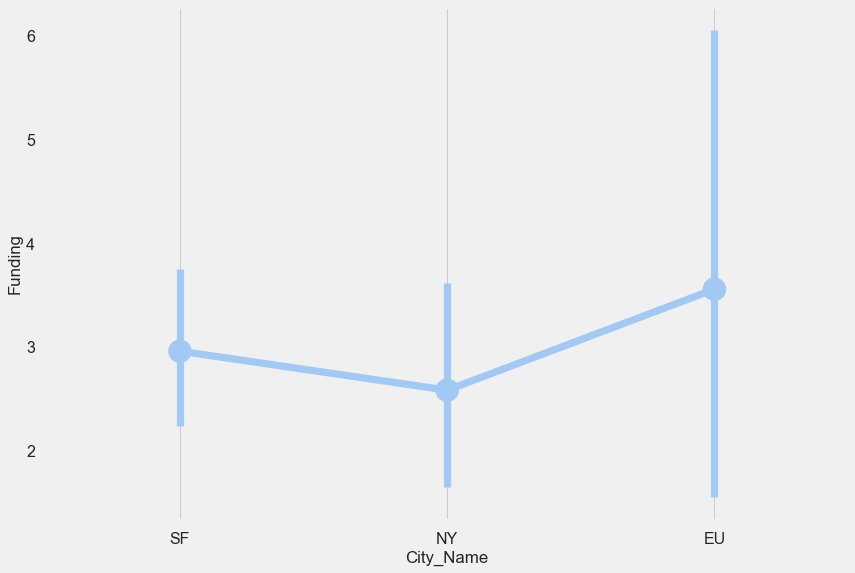

In [122]:
sns.pointplot(x = 'City_Name', y = 'Funding',data=final_ANOVA)
plt.grid()
plt.show()

## Boxplot comparing the funding across three cities.

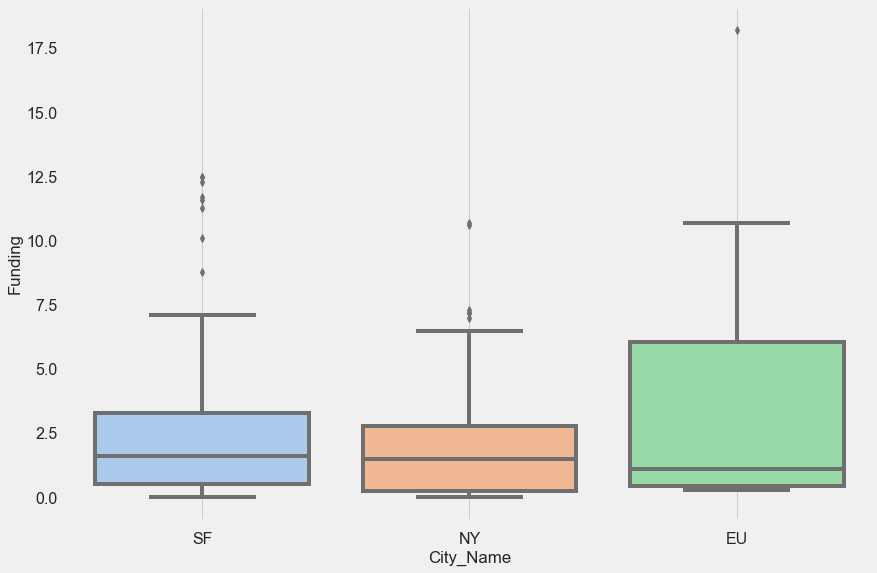

In [123]:
sns.boxplot(x="City_Name", y="Funding", data=final_ANOVA)
plt.grid()
plt.show()

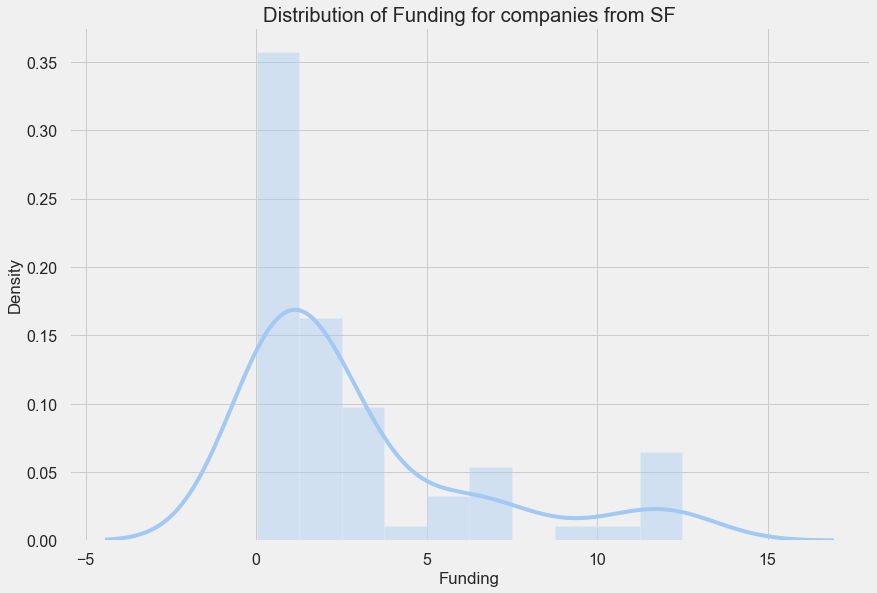

In [124]:
sns.distplot(final_ANOVA[final_ANOVA['City_Name']== 'SF']['Funding'], hist = True)
plt.title('Distribution of Funding for companies from SF')
plt.show()

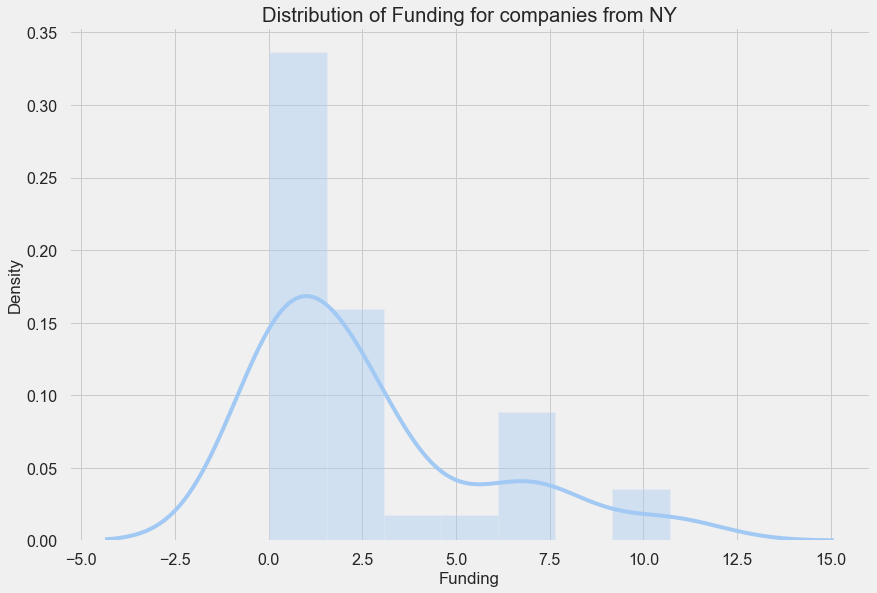

In [125]:
sns.distplot(final_ANOVA[final_ANOVA['City_Name']== 'NY']['Funding'], hist = True)
plt.title('Distribution of Funding for companies from NY')
plt.show()

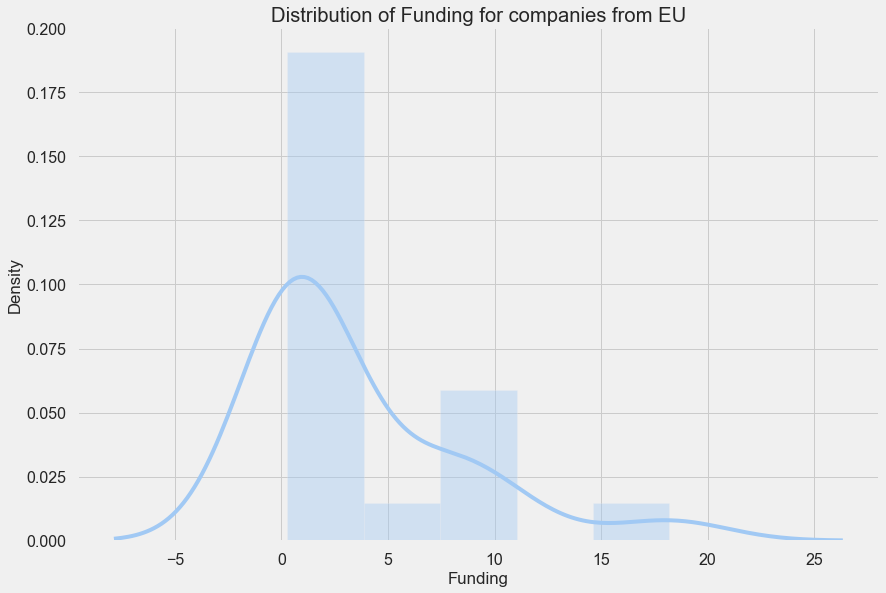

In [126]:
sns.distplot(final_ANOVA[final_ANOVA['City_Name']== 'EU']['Funding'], hist = True)
plt.title('Distribution of Funding for companies from EU')
plt.show()

In [127]:
df['Event_year'].value_counts()

2015    61
2014    56
2016    55
2013    47
2011    38
2012    34
2008    25
2010    23
2007    22
2009    19
Name: Event_year, dtype: int64

### Suggestions 

1. Data has problems - There are '-' in few places (6).

2. Funding is heavily right skewed.

3. Many Outliers are present in funding. How proper is the data collection strategy for funding?

4. Data for other cities apart from 'SF', 'NY' and 'EU' are very few in number.

5. As the year progresses the volume is increasing so velocity looks good here.
